# <center>           Homework 2 - Unsupervised Deep Learning </center>

## <center> Edoardo Antonaci 1234431 </center>

In [1]:
!pip install skorch

     |████████████████████████████████| 133kB 8.2MB/s 


## Importing Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Libraries

In [3]:
%load_ext autoreload
%matplotlib inline
%autoreload 2

In [4]:
from IPython import display
import numpy as np
import random
import torch
import torchvision
from torchvision import datasets,transforms
from tqdm import tqdm

from torch.utils.data import DataLoader
import torch.nn.functional as F

from torch import nn, optim
from torch.autograd.variable import Variable
import matplotlib.pyplot as plt

from sklearn.model_selection import KFold
import os

from sklearn import manifold
from torchvision.utils import save_image
import itertools

from skorch import NeuralNetClassifier
from skorch.callbacks import EarlyStopping
from sklearn.model_selection import GridSearchCV

import datetime
import math
import shutil

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix

In [5]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Training device: {device}")

Training device: cuda


## Load Data

In [10]:
DATA_FOLDER = 'DATA_homework2'

In [11]:
def mnist_data():
    compose = transforms.Compose(
        [
         transforms.ToTensor()
        ])
    out_dir_train = '{}/dataset_train'.format(DATA_FOLDER)
    out_dir_test =  '{}/dataset_test'.format(DATA_FOLDER)
    return (torchvision.datasets.MNIST(root=out_dir_train, train=True, transform=compose, download=True),
            torchvision.datasets.MNIST(root=out_dir_test, train=False, transform=compose, download=True) )

In [12]:
# Load data
data_train,data_test = mnist_data()


Extracting DATA_homework2/dataset_train/MNIST/raw/train-images-idx3-ubyte.gz to DATA_homework2/dataset_train/MNIST/raw




Extracting DATA_homework2/dataset_train/MNIST/raw/train-labels-idx1-ubyte.gz to DATA_homework2/dataset_train/MNIST/raw




Extracting DATA_homework2/dataset_train/MNIST/raw/t10k-images-idx3-ubyte.gz to DATA_homework2/dataset_train/MNIST/raw




Extracting DATA_homework2/dataset_train/MNIST/raw/t10k-labels-idx1-ubyte.gz to DATA_homework2/dataset_train/MNIST/raw



/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:498: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:180.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)



Extracting DATA_homework2/dataset_test/MNIST/raw/train-images-idx3-ubyte.gz to DATA_homework2/dataset_test/MNIST/raw




Extracting DATA_homework2/dataset_test/MNIST/raw/train-labels-idx1-ubyte.gz to DATA_homework2/dataset_test/MNIST/raw




Extracting DATA_homework2/dataset_test/MNIST/raw/t10k-images-idx3-ubyte.gz to DATA_homework2/dataset_test/MNIST/raw

Failed to download (trying next):
HTTP Error 503: Service Unavailable




Extracting DATA_homework2/dataset_test/MNIST/raw/t10k-labels-idx1-ubyte.gz to DATA_homework2/dataset_test/MNIST/raw



In [ ]:
data_train

Dataset MNIST
    Number of datapoints: 60000
    Root location: DATA_homework2/dataset_train
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
           )

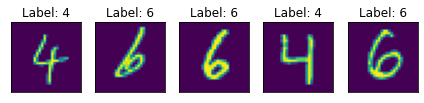

In [ ]:
### Plot some sample
fig, axs = plt.subplots(1, 5, figsize=(6,6))
for ax in axs.flatten():
    img, label = random.choice(data_train)
    ax.imshow(np.array(img.reshape(28,28)))
    ax.set_title('Label: %d' % label)
    ax.set_xticks([])
    ax.set_yticks([])
plt.tight_layout()

# **Network definition** 

In [ ]:
class AutoEncoder_HP(nn.Module):


    def __init__(self,encoded_space_dim):
        super().__init__()
        
        
        # Encoder
        self.encoder = nn.Sequential(
                                        
                                        # First convolutional layer
                                        nn.Conv2d(1,8, kernel_size=8, padding=0, stride=4),
                                        nn.ReLU(True),
            
                                        # Flatten layer
                                        nn.Flatten(start_dim=1),
            
                                        # First linear layer
                                        nn.Linear(36*8,64),  
                                        nn.ReLU(True),
            
                                        #Second linear layer (output layer)
                                        nn.Linear(64, encoded_space_dim) 
                                    )
        # Decoder
        self.decoder =  nn.Sequential(
                                        # First linear layer
                                        nn.Linear(encoded_space_dim,64),
                                        nn.ReLU(True),
            
                                        # Second linear layer
                                        nn.Linear(64, 36*8), 
                                        nn.ReLU(True),
            
                                        # Unflatten
                                        nn.Unflatten(dim=1, unflattened_size=(8,6, 6)),
                                        # First transposed convolution
                              
            
                                        # Third transposed convolution
                                        nn.ConvTranspose2d(8, 1, kernel_size=8, output_padding=0, padding=0, stride=4),
                                        nn.Sigmoid()
                                    )
        
    def forward(self, x):
        
        x = self.encoder(x)
        
        x = self.decoder(x)
        
        return x



## initialitation

In [ ]:
AutoEncoder_init=AutoEncoder_HP(encoded_space_dim=2).to(device)

AutoEncoder_init

AutoEncoder_HP(
  (encoder): Sequential(
    (0): Conv2d(1, 8, kernel_size=(8, 8), stride=(4, 4))
    (1): ReLU(inplace=True)
    (2): Flatten(start_dim=1, end_dim=-1)
    (3): Linear(in_features=288, out_features=64, bias=True)
    (4): ReLU(inplace=True)
    (5): Linear(in_features=64, out_features=2, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=2, out_features=64, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=64, out_features=288, bias=True)
    (3): ReLU(inplace=True)
    (4): Unflatten(dim=1, unflattened_size=(8, 6, 6))
    (5): ConvTranspose2d(8, 1, kernel_size=(8, 8), stride=(4, 4))
    (6): Sigmoid()
  )
)

## recontructed images before training

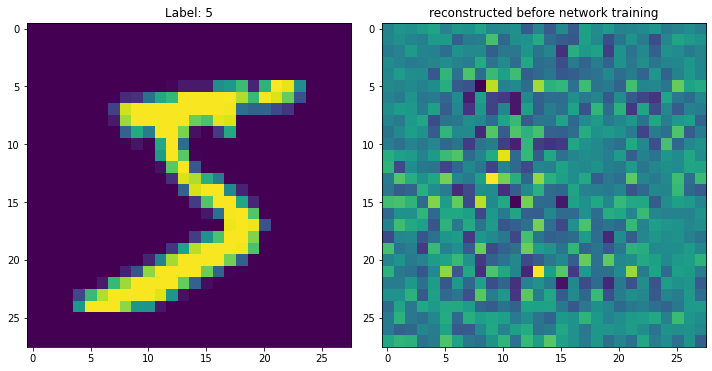

In [ ]:
img,label=data_train[0]
img = img.unsqueeze(0).to(device)
img_recontructed=AutoEncoder_init(img).cpu().detach().numpy() 

fig, axs = plt.subplots(1, 2, figsize=(10,10))

axs[0].imshow(img.squeeze(0).cpu().detach().numpy().reshape(28,28) )
axs[0].set_title('Label: %d' % label)

axs[1].imshow(img_recontructed.reshape(28,28) )
axs[1].set_title('reconstructed before network training')

plt.tight_layout()

## Plot and save progress

In [ ]:
if os.path.isdir("network_parameters") == False:
    dir_name="network_parameters"
    os.mkdir(dir_name)

path="network_parameters/"

In [ ]:
def plot_save_progress(net,epoch,num_epochs,train_loss,val_loss,val_dataset,encoded_space_dim):


      # Print losses
      print('EPOCH %d/%d' % (epoch + 1, num_epochs))
      print('TRAINING - EPOCH %d/%d - loss: %f' % (epoch + 1, num_epochs, train_loss[epoch]))
      print('TEST - EPOCH %d/%d - loss: %f' % (epoch + 1, num_epochs, val_loss[epoch]))
      # Plot progress
      img = val_dataset[0][0].unsqueeze(0).to(device)
      net.eval()
      with torch.no_grad():
          rec_img  = net(img)
      fig, axs = plt.subplots(1, 2, figsize=(12,6))
      axs[0].imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      axs[0].set_title('Original image')
      axs[1].imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')
      axs[1].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
      plt.tight_layout()
      # Save figures
      #folder
      if os.path.isdir(('autoencoder_progress_%d_features' % encoded_space_dim ) ) == False :
        os.mkdir('autoencoder_progress_%d_features' % encoded_space_dim)

      plt.savefig('autoencoder_progress_%d_features/epoch_%d.png' % (encoded_space_dim, epoch + 1))
      plt.show()
      plt.close()

      # Save network parameters
      torch.save(net.state_dict(), path+'best_net_params.pth')

In [ ]:
def Early_Stopping(epoch,test_loss,patience):


 if test_loss[epoch] > np.mean(test_loss[epoch-patience]) :

   return (1)
    
 return (0)


## trianing and test epoch

In [ ]:


### Training function
def train_epoch(net, dataloader, loss_fn, optimizer):
    # Training
    net.train()

    lt = []
    for sample_batch in dataloader:
        # Extract data and move tensors to the selected device
        image_batch = sample_batch[0].to(device)
        # Forward pass
        output = net(image_batch)
        loss = loss_fn(output, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        lt.append(float(loss.data))
    
    return np.mean(np.array(lt))

def test_epoch(net, dataloader, loss_fn):
    # Validation
    net.eval() # Evaluation mode (e.g. disable dropout)
    with torch.no_grad(): # No need to track the gradients
        conc_out = torch.Tensor().float().to(device)
        conc_label = torch.Tensor().float().to(device)
        for sample_batch in dataloader:
            # Extract data and move tensors to the selected device
            image_batch = sample_batch[0].to(device)
            # Forward pass
            out = net(image_batch)
            # Concatenate with previous outputs
            conc_out = torch.cat([conc_out, out])
            conc_label = torch.cat([conc_label, image_batch]) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return float(val_loss.data)

# **training network**

In [ ]:
def training(net, train_dataloader, test_dataloader,encoded_space_dim, loss_fn, optimizer, num_epochs,patience,save,test):
    if num_epochs <= patience :
        print("num_epochs :",num_epochs,"is less than patience :",patience)
        
    train_loss = []
    test_loss = []
    for epoch in range(num_epochs):
        ### Training
        tl = train_epoch(net, dataloader=train_dataloader, loss_fn=loss_fn, optimizer=optimizer) 
        train_loss.append(tl)
        ### Validation
        vl = test_epoch(net, dataloader=test_dataloader, loss_fn=loss_fn)
        test_loss.append(vl) 

        if save==True and (epoch+1)%2==0 :
          plot_save_progress(net,epoch,num_epochs,train_loss,test_loss,data_test,encoded_space_dim)
            
        if epoch > patience :
          early=Early_Stopping(epoch=epoch,test_loss=test_loss,patience=patience)
          if early==1:
            print('Stop due to early stopping!')
            break
          if save==True and early==1 :
            plot_save_progress(net,epoch,num_epochs,train_loss,test_loss,data_test,encoded_space_dim)
            print('Stop due to early stopping!')
            break
     

    # Plot losses 
    plt.plot(train_loss,label='Training')
    if test==True:
      plt.plot(test_loss, label='Test')
    else:
      plt.plot(test_loss, label='Validation')
    plt.legend()
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.yscale('log')
    plt.savefig(path+'training.png')
    plt.show()


    return train_loss, test_loss

## Cross Validation

In [ ]:
def CrossValidation(train_dataset, folds,encoded_space_dim, lr, weight_decay):
  
  print('----------------------------')
  print('Encoded space dim: ',encoded_space_dim)
  print('Learning rate:', lr)
  print('Weight decay:', weight_decay)

  # Some hyperparameters fixed
  num_epochs=20
  patience=5        


  # Split and train
  kf = KFold(n_splits=folds,random_state=0, shuffle=True)
  kf.get_n_splits(train_dataset)

  loss = 0
  cv = 0
  for train_index, test_index in kf.split(train_dataset):
      print('********')
      print('Fold:', cv+1) 
      # Define the network 
      net = AutoEncoder_HP(encoded_space_dim=encoded_space_dim)
      net.to(device)
      # Define the optimizer
      optimizer = torch.optim.Adam(net.parameters(), lr=lr, weight_decay=weight_decay)
      # Define loss function
      loss_fn = torch.nn.MSELoss()
      # K fold
      ktrain = torch.utils.data.Subset(train_dataset, train_index)
      ktest= torch.utils.data.Subset(train_dataset, test_index)
      ktrain_dataloader = DataLoader(ktrain, batch_size=512, shuffle=True)
      ktest_dataloader = DataLoader(ktest, batch_size=512, shuffle=False)
      # Perform training
      tloss, vloss = training(net, ktrain_dataloader, ktest_dataloader,encoded_space_dim, loss_fn, optimizer,num_epochs,patience,False,False)
      loss += vloss[-1]
      cv += 1
      
  print('********')
  final_loss = loss/folds
  print('Loss:', final_loss)
  print('----------------------------')
  print('\n')

  return final_loss

## Grid Search

In [ ]:
def grid_search(par,data_train):

  summary={
          "encoded dim":[],
          "learning rate":[],
          "weight decay":[],
          "loss":[]
           }

  for enc in par["enc"]:
    for lr in par["lr"]:
      for w_d in par["w_d"] :

          final_loss = CrossValidation(data_train,folds=3,encoded_space_dim=enc,lr=lr,weight_decay=w_d) 

          summary["encoded dim"].append(enc)
          summary["learning rate"].append(lr)
          summary["weight decay"].append(w_d)
          summary["loss"].append(final_loss)

  id_min_error=np.argmin(summary["loss"])
  best_configuration=(
                       summary["encoded dim"][id_min_error],
                       summary["learning rate"][id_min_error],
                       summary["weight decay"][id_min_error],
                       summary["loss"][id_min_error])

  print("Best configuration is :\n")
  print("encoded dim : ",best_configuration[0],"\n")
  print("learning rate :",best_configuration[1],"\n")
  print("weight decay :",best_configuration[2],"\n")
  print("loss :",best_configuration[3],"\n")

  

  return best_configuration


----------------------------
Encoded space dim:  2
Learning rate: 0.001
Weight decay: 1e-05
********
Fold: 1


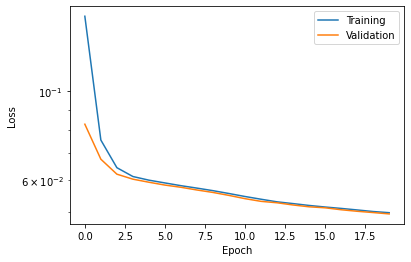

********
Fold: 2


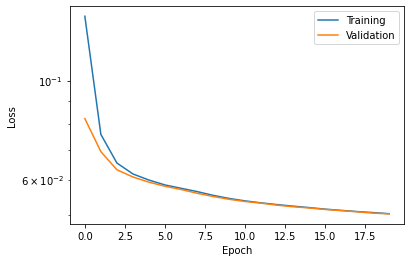

********
Fold: 3


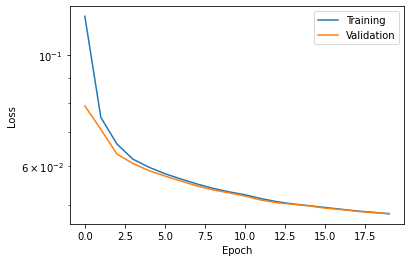

********
Loss: 0.04930741712450981
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.001
Weight decay: 3e-05
********
Fold: 1


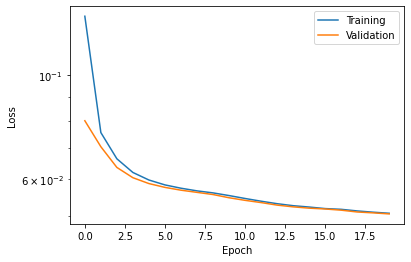

********
Fold: 2


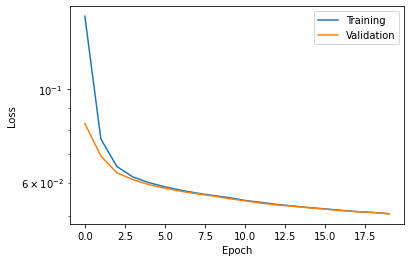

********
Fold: 3


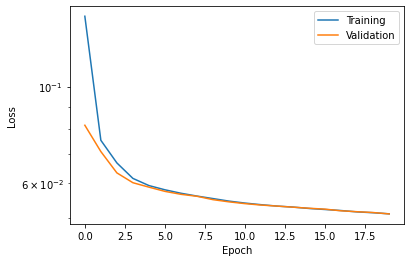

********
Loss: 0.05075707286596298
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.001
Weight decay: 6e-05
********
Fold: 1


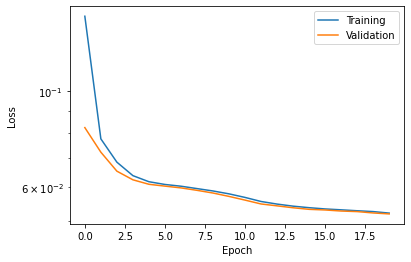

********
Fold: 2


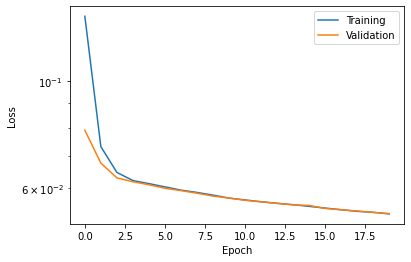

********
Fold: 3


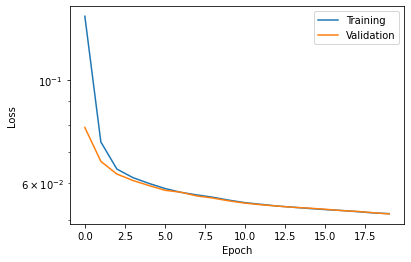

********
Loss: 0.05224144707123438
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.001
Weight decay: 0.0001
********
Fold: 1


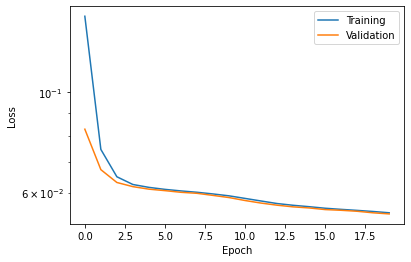

********
Fold: 2


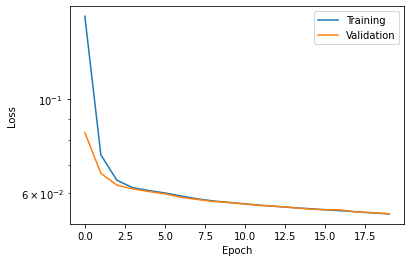

********
Fold: 3


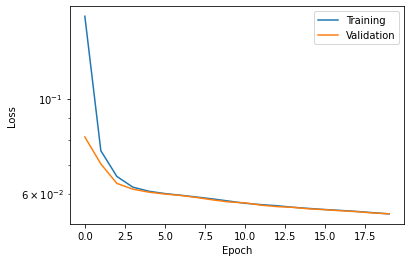

********
Loss: 0.05377879242102305
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.003
Weight decay: 1e-05
********
Fold: 1


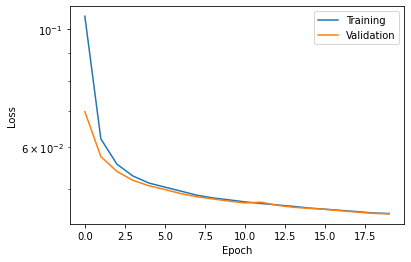

********
Fold: 2


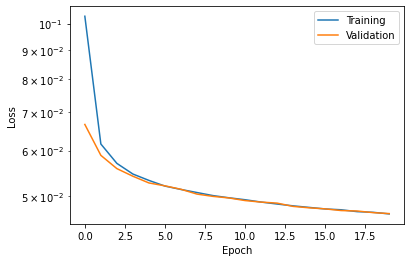

********
Fold: 3


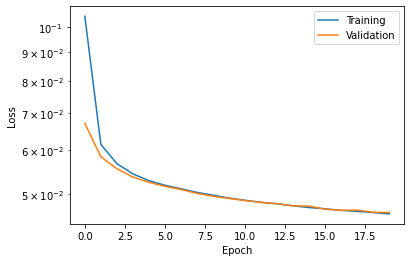

********
Loss: 0.04590501139561335
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.003
Weight decay: 3e-05
********
Fold: 1


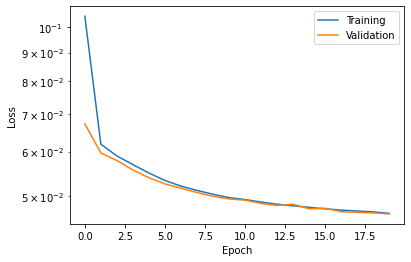

********
Fold: 2


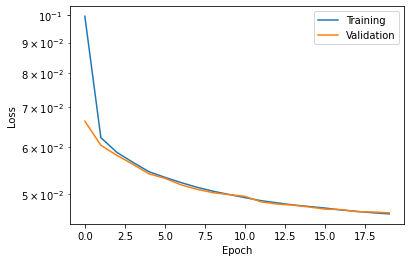

********
Fold: 3


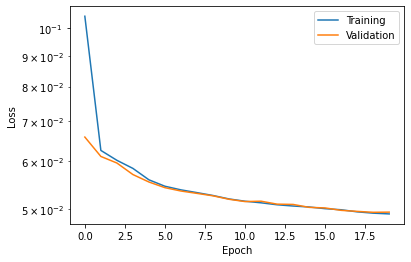

********
Loss: 0.0474381223320961
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.003
Weight decay: 6e-05
********
Fold: 1


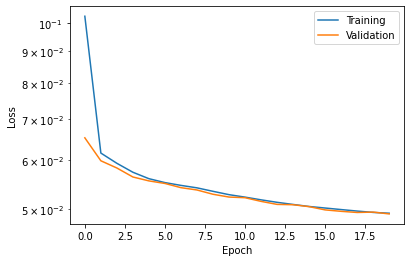

********
Fold: 2


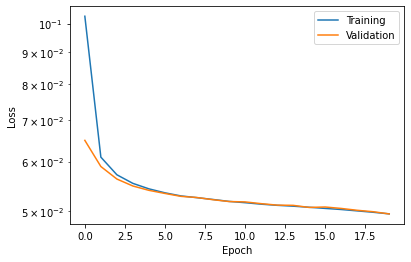

********
Fold: 3


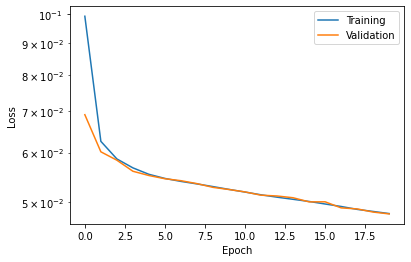

********
Loss: 0.048801910132169724
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.003
Weight decay: 0.0001
********
Fold: 1


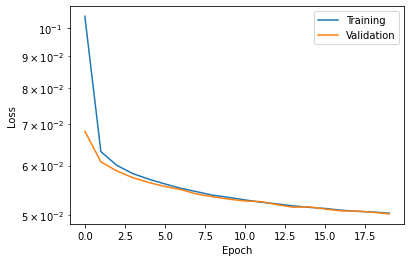

********
Fold: 2


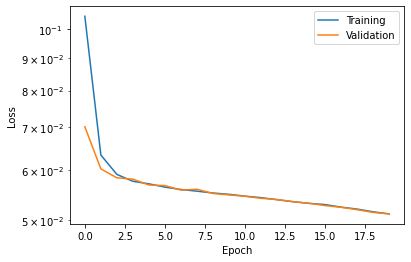

********
Fold: 3


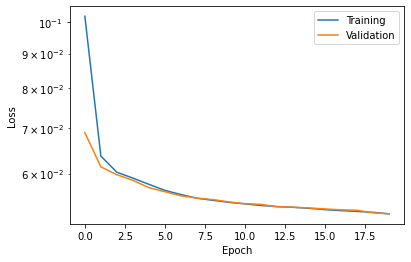

********
Loss: 0.05122165630261103
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.006
Weight decay: 1e-05
********
Fold: 1


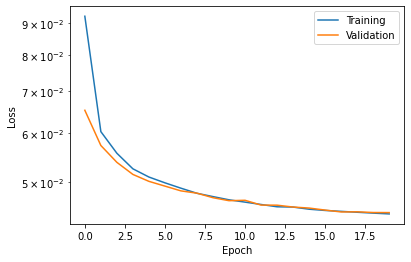

********
Fold: 2


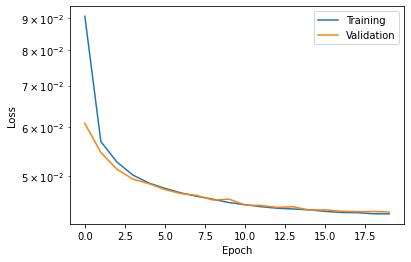

********
Fold: 3


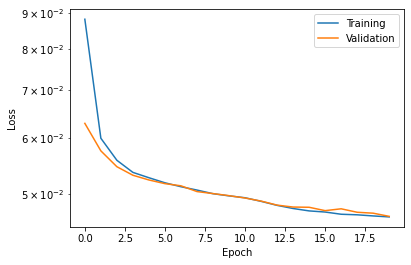

********
Loss: 0.044966068118810654
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.006
Weight decay: 3e-05
********
Fold: 1
Stop due to early stopping!


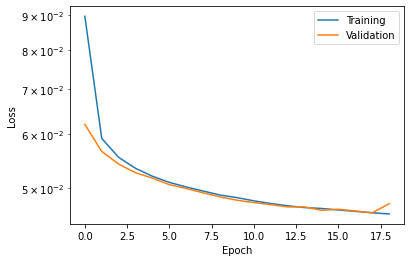

********
Fold: 2


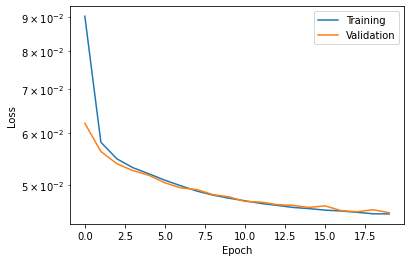

********
Fold: 3


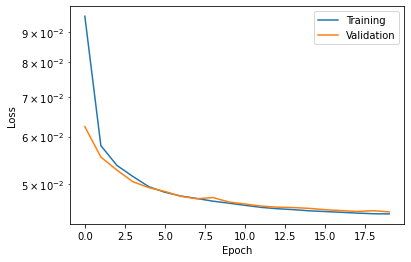

********
Loss: 0.04590839768449465
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.006
Weight decay: 6e-05
********
Fold: 1
Stop due to early stopping!


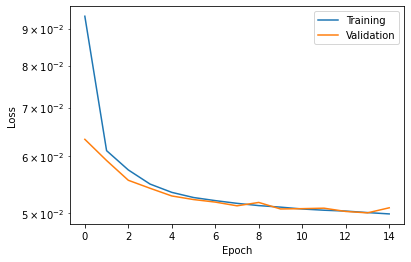

********
Fold: 2


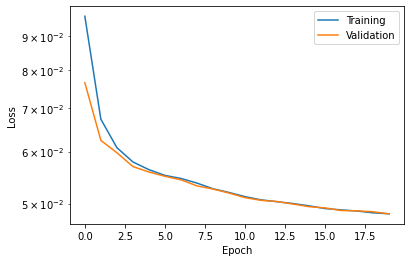

********
Fold: 3


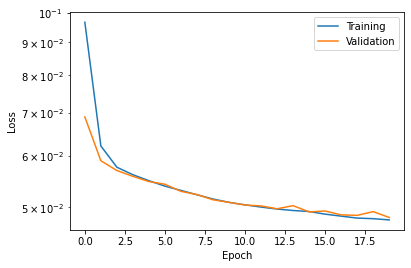

********
Loss: 0.049094910422960915
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.006
Weight decay: 0.0001
********
Fold: 1


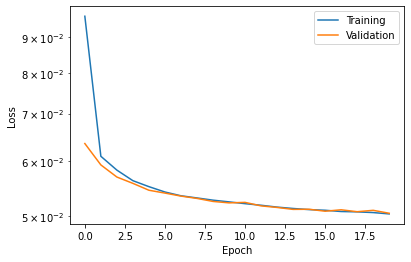

********
Fold: 2


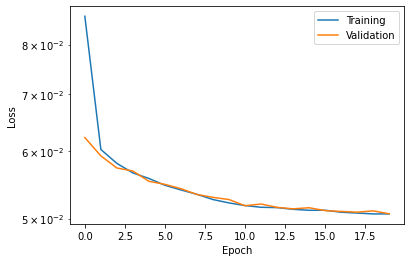

********
Fold: 3


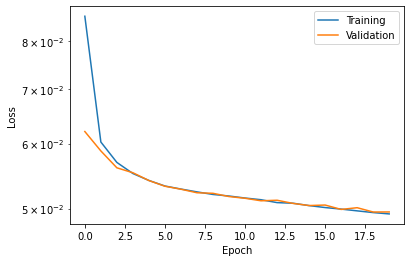

********
Loss: 0.050242104878028236
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.01
Weight decay: 1e-05
********
Fold: 1
Stop due to early stopping!


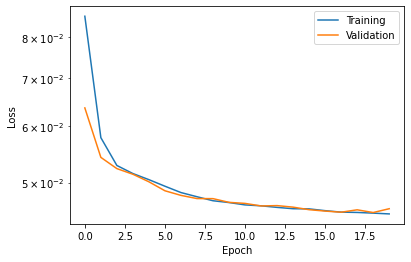

********
Fold: 2


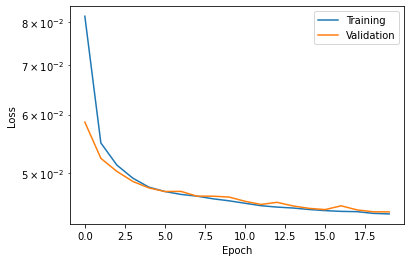

********
Fold: 3


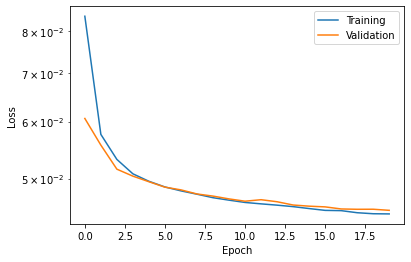

********
Loss: 0.045177449782689415
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.01
Weight decay: 3e-05
********
Fold: 1


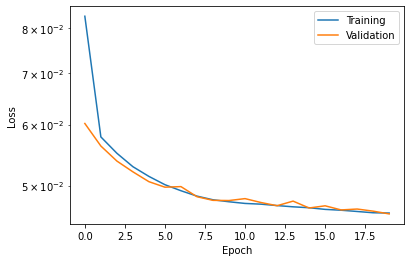

********
Fold: 2
Stop due to early stopping!


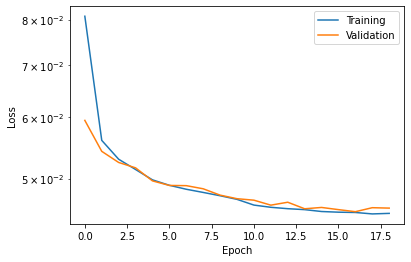

********
Fold: 3


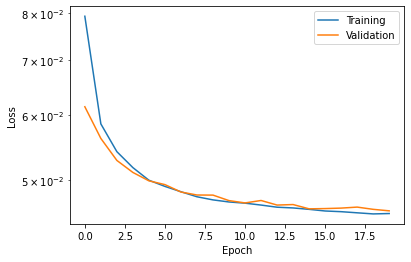

********
Loss: 0.04586080461740494
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.01
Weight decay: 6e-05
********
Fold: 1


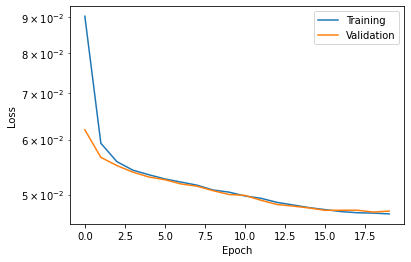

********
Fold: 2


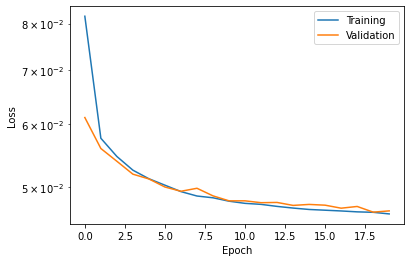

********
Fold: 3


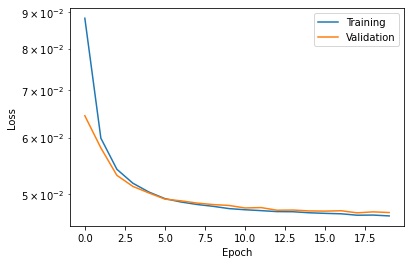

********
Loss: 0.04707203432917595
----------------------------


----------------------------
Encoded space dim:  2
Learning rate: 0.01
Weight decay: 0.0001
********
Fold: 1


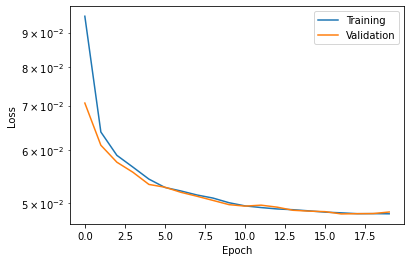

********
Fold: 2
Stop due to early stopping!


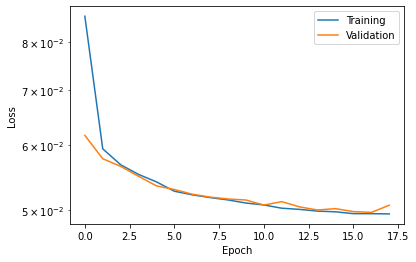

********
Fold: 3
Stop due to early stopping!


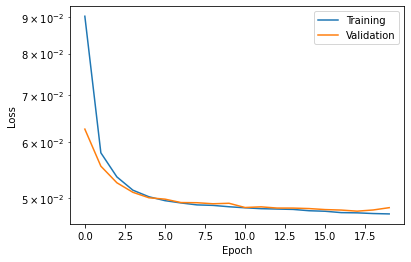

********
Loss: 0.049246273934841156
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.001
Weight decay: 1e-05
********
Fold: 1


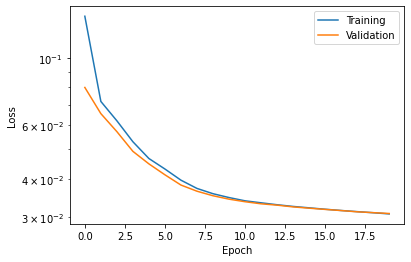

********
Fold: 2


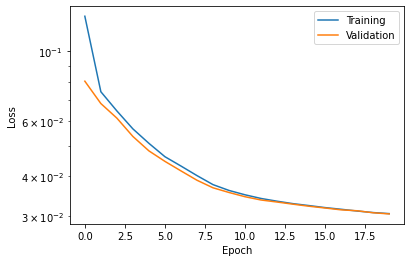

********
Fold: 3


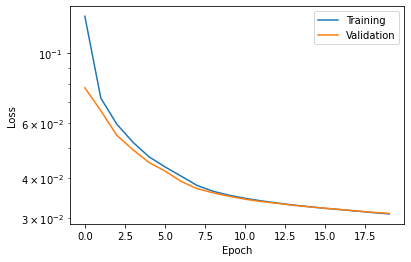

********
Loss: 0.030727521205941837
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.001
Weight decay: 3e-05
********
Fold: 1


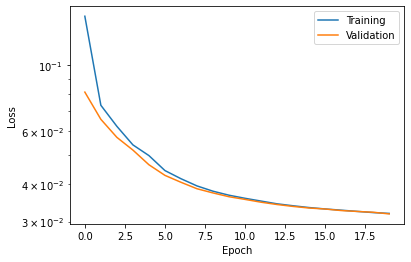

********
Fold: 2


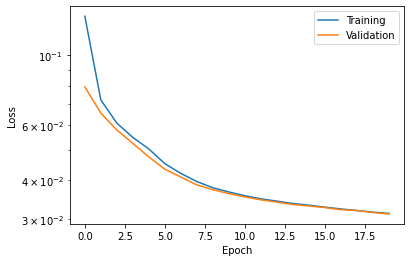

********
Fold: 3


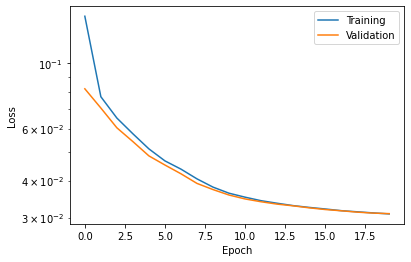

********
Loss: 0.031310622890790306
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.001
Weight decay: 6e-05
********
Fold: 1


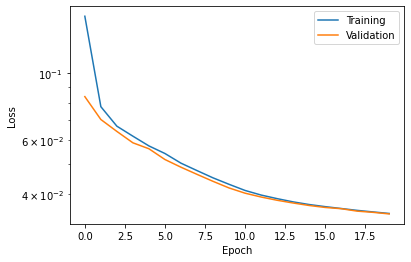

********
Fold: 2


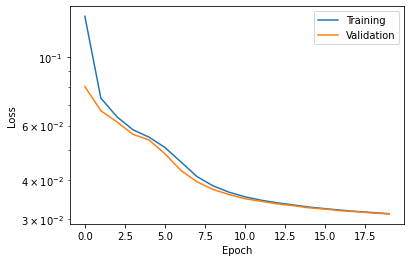

********
Fold: 3


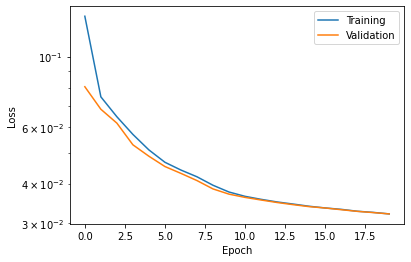

********
Loss: 0.03252452425658703
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.001
Weight decay: 0.0001
********
Fold: 1


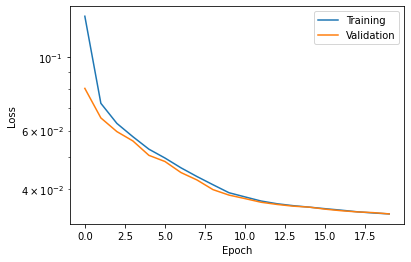

********
Fold: 2


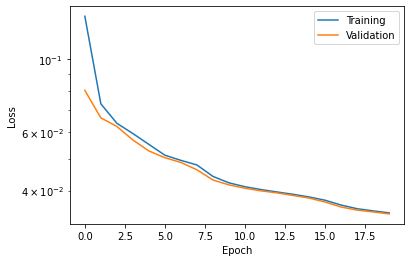

********
Fold: 3


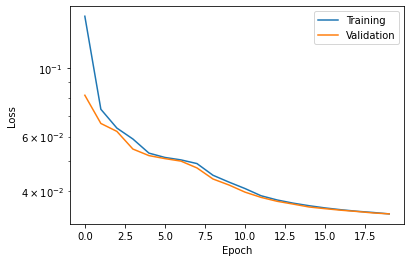

********
Loss: 0.03380683312813441
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.003
Weight decay: 1e-05
********
Fold: 1


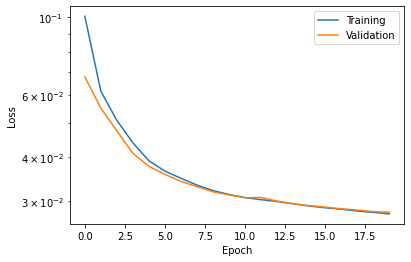

********
Fold: 2


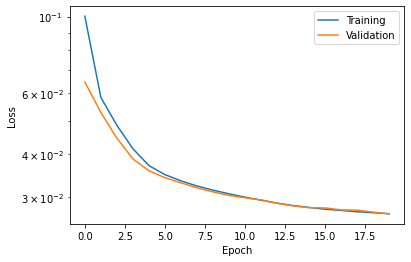

********
Fold: 3


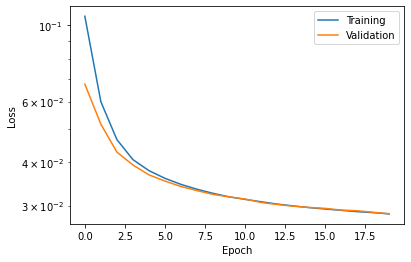

********
Loss: 0.0277147659411033
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.003
Weight decay: 3e-05
********
Fold: 1


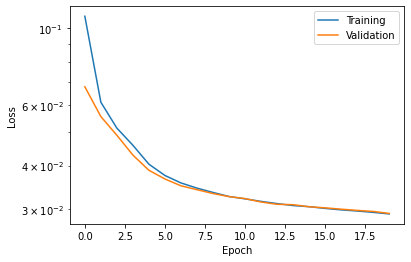

********
Fold: 2


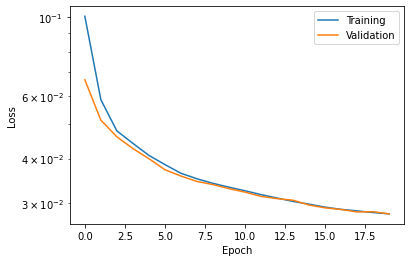

********
Fold: 3


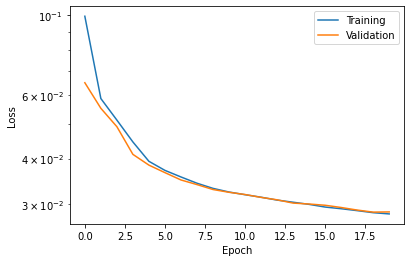

********
Loss: 0.028506817296147346
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.003
Weight decay: 6e-05
********
Fold: 1


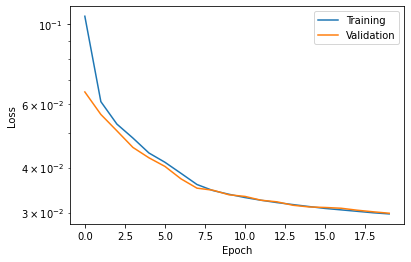

********
Fold: 2


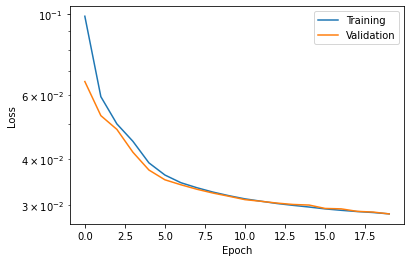

********
Fold: 3


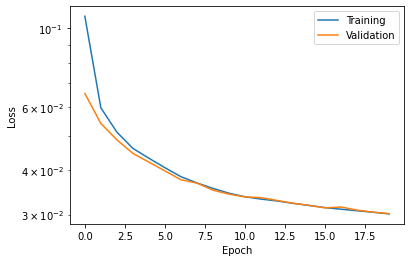

********
Loss: 0.02946543941895167
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.003
Weight decay: 0.0001
********
Fold: 1


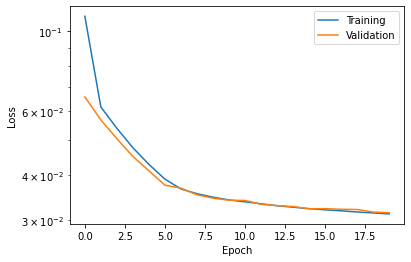

********
Fold: 2


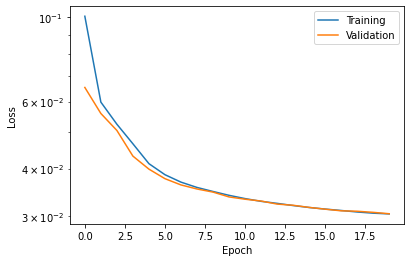

********
Fold: 3


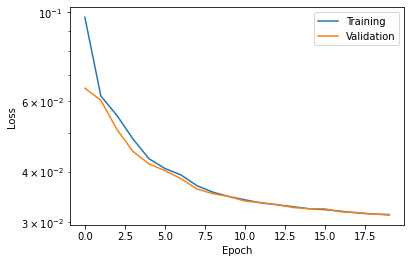

********
Loss: 0.031069959203402202
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.006
Weight decay: 1e-05
********
Fold: 1


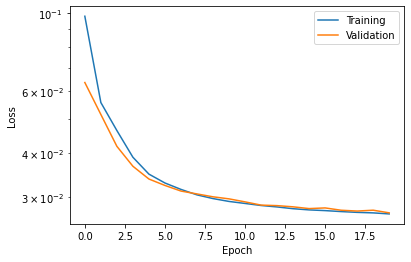

********
Fold: 2


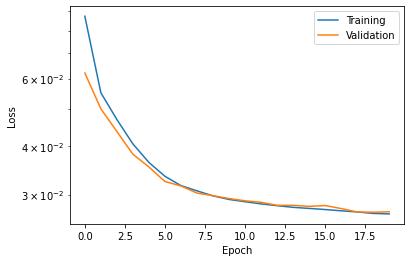

********
Fold: 3


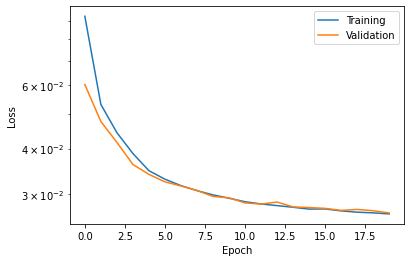

********
Loss: 0.02690004309018453
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.006
Weight decay: 3e-05
********
Fold: 1


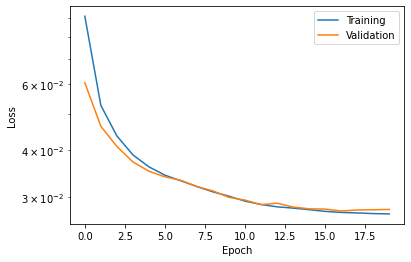

********
Fold: 2
Stop due to early stopping!


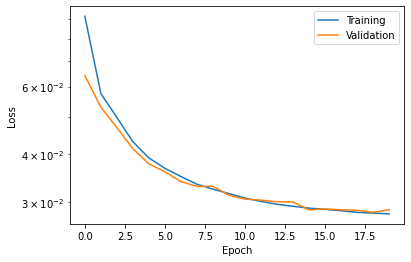

********
Fold: 3


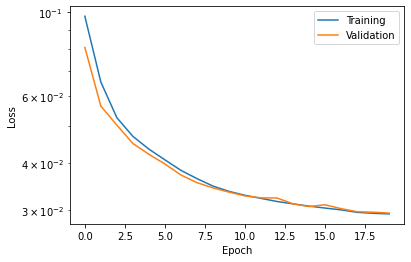

********
Loss: 0.028661283974846203
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.006
Weight decay: 6e-05
********
Fold: 1


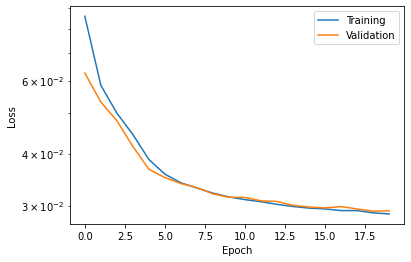

********
Fold: 2


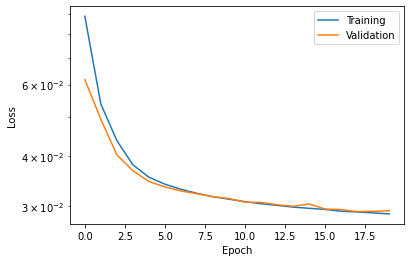

********
Fold: 3


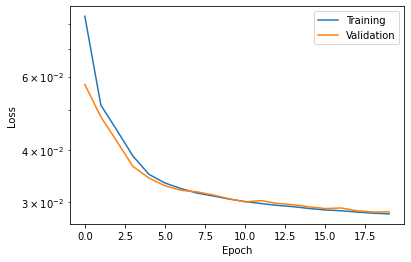

********
Loss: 0.028937047347426414
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.006
Weight decay: 0.0001
********
Fold: 1


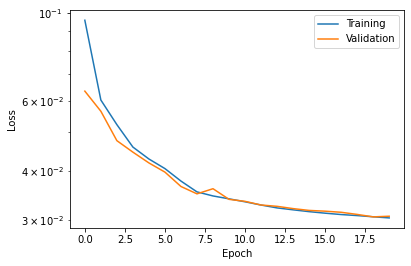

********
Fold: 2


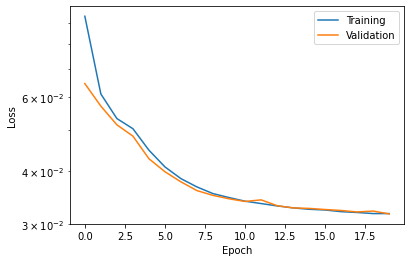

********
Fold: 3


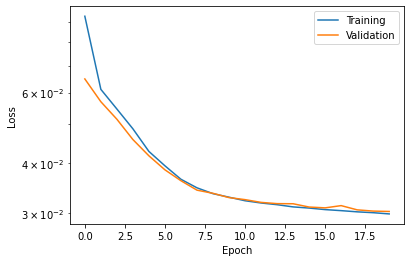

********
Loss: 0.03089833694199721
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.01
Weight decay: 1e-05
********
Fold: 1
Stop due to early stopping!


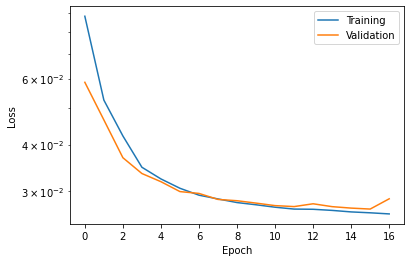

********
Fold: 2


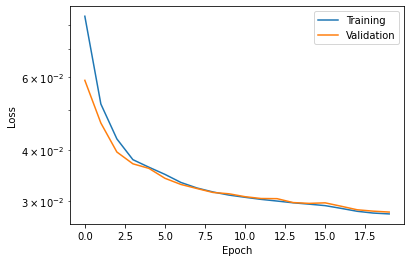

********
Fold: 3


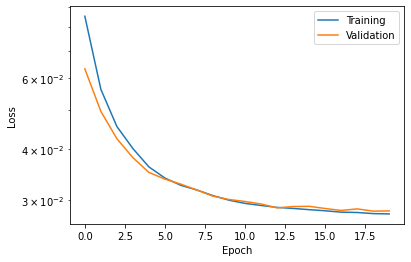

********
Loss: 0.02837510717411836
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.01
Weight decay: 3e-05
********
Fold: 1


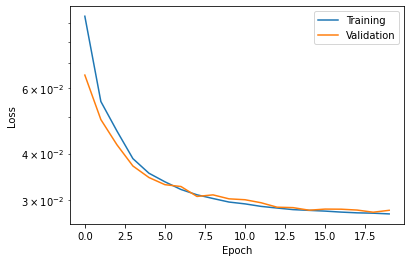

********
Fold: 2


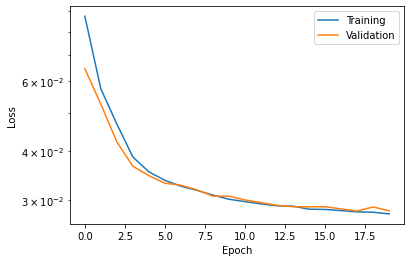

********
Fold: 3
Stop due to early stopping!


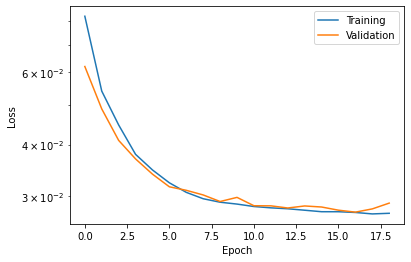

********
Loss: 0.028408254807194073
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.01
Weight decay: 6e-05
********
Fold: 1


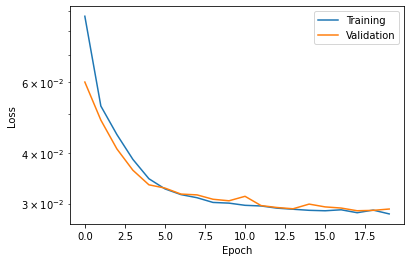

********
Fold: 2


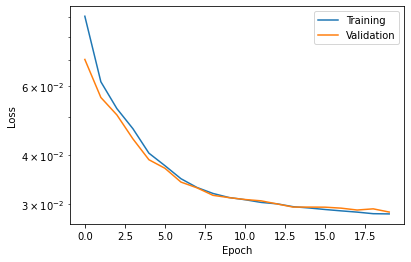

********
Fold: 3


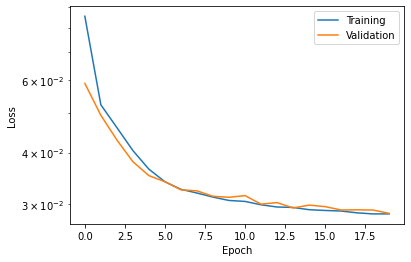

********
Loss: 0.028764240443706512
----------------------------


----------------------------
Encoded space dim:  6
Learning rate: 0.01
Weight decay: 0.0001
********
Fold: 1


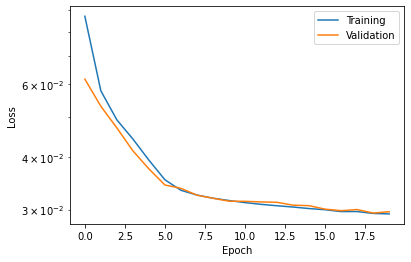

********
Fold: 2


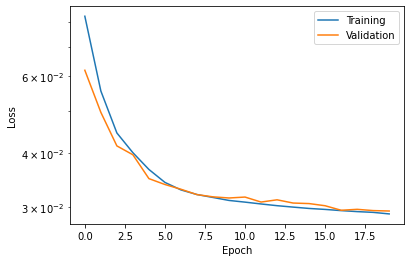

********
Fold: 3


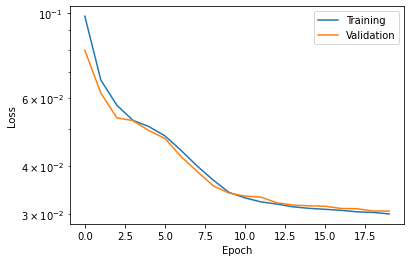

********
Loss: 0.02984091391166051
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.001
Weight decay: 1e-05
********
Fold: 1


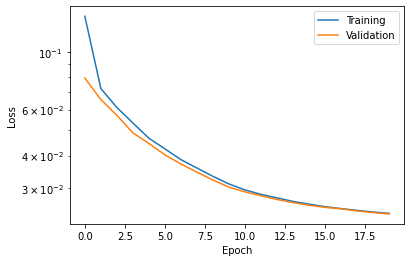

********
Fold: 2


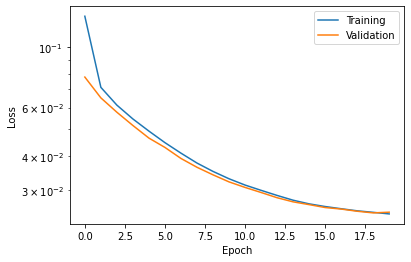

********
Fold: 3


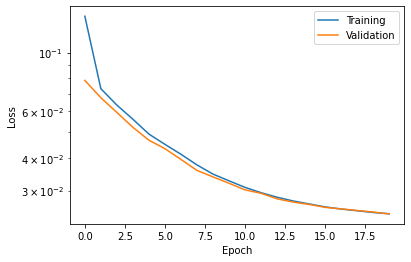

********
Loss: 0.024434305106600124
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.001
Weight decay: 3e-05
********
Fold: 1


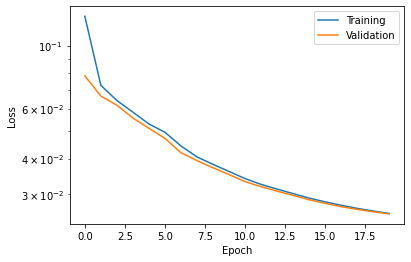

********
Fold: 2


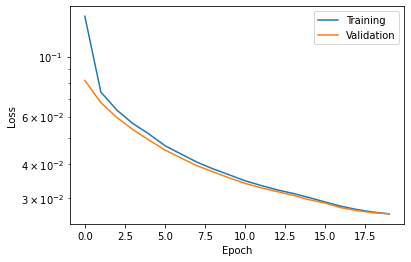

********
Fold: 3


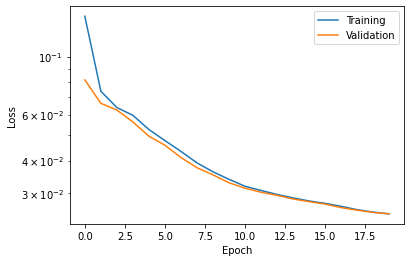

********
Loss: 0.02559685769180457
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.001
Weight decay: 6e-05
********
Fold: 1


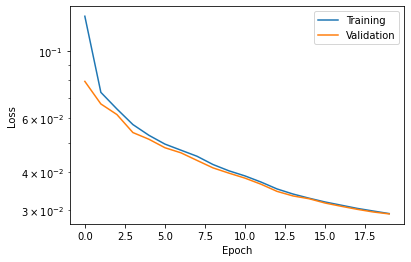

********
Fold: 2


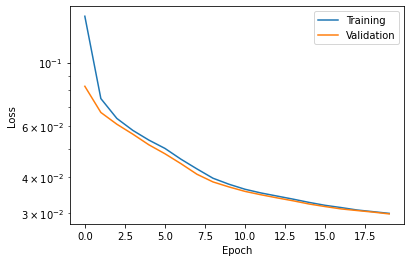

********
Fold: 3


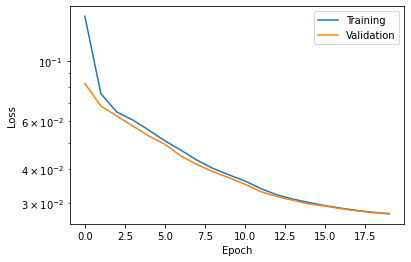

********
Loss: 0.02881176086763541
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.001
Weight decay: 0.0001
********
Fold: 1


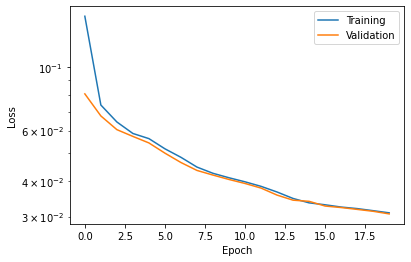

********
Fold: 2


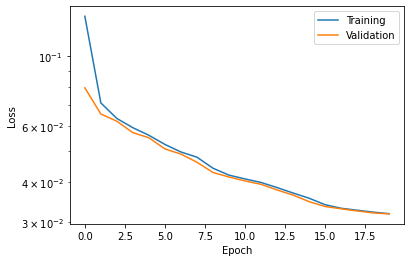

********
Fold: 3


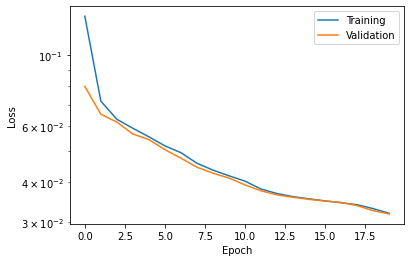

********
Loss: 0.03142670728266239
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.003
Weight decay: 1e-05
********
Fold: 1


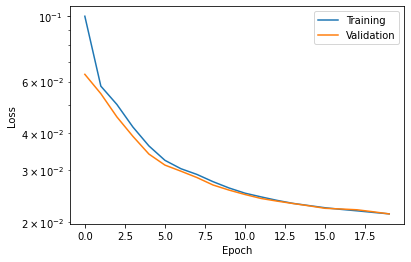

********
Fold: 2


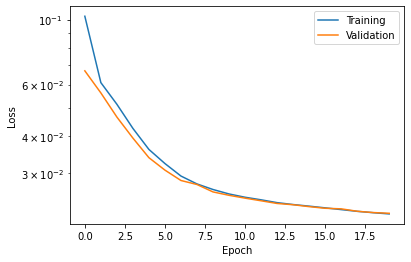

********
Fold: 3


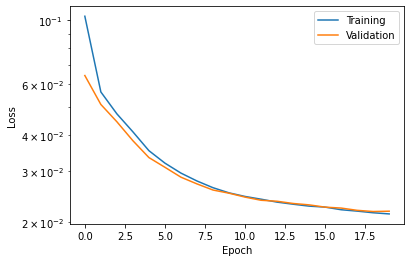

********
Loss: 0.021660684918363888
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.003
Weight decay: 3e-05
********
Fold: 1


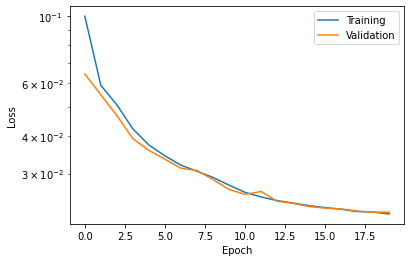

********
Fold: 2


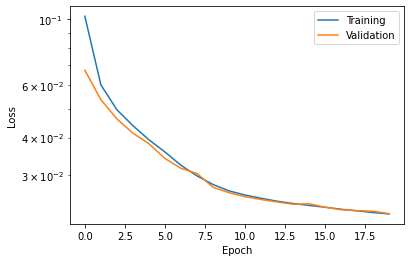

********
Fold: 3


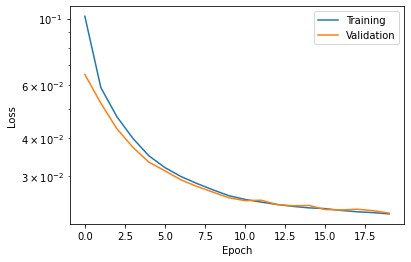

********
Loss: 0.02239459442595641
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.003
Weight decay: 6e-05
********
Fold: 1


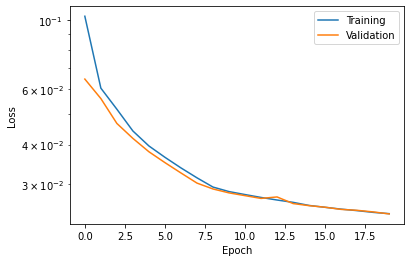

********
Fold: 2


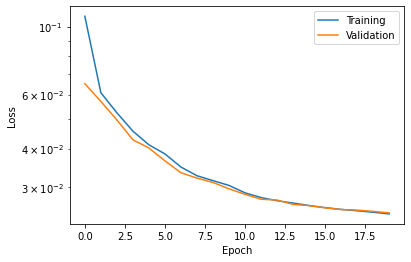

********
Fold: 3


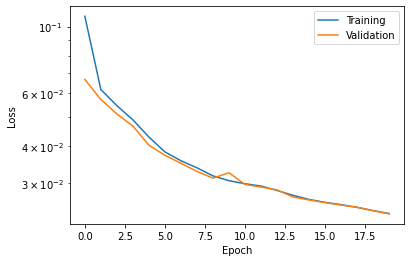

********
Loss: 0.02415621466934681
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.003
Weight decay: 0.0001
********
Fold: 1


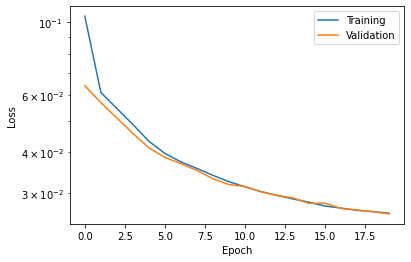

********
Fold: 2


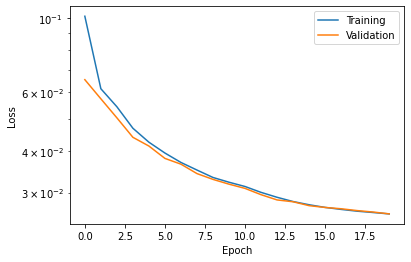

********
Fold: 3


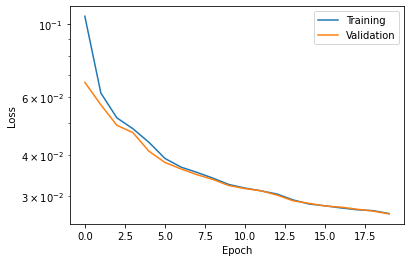

********
Loss: 0.026125222444534302
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.006
Weight decay: 1e-05
********
Fold: 1


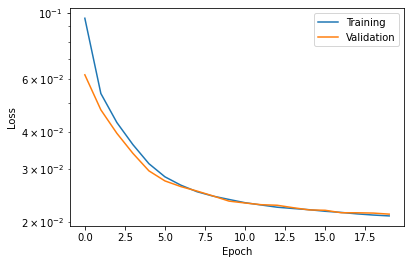

********
Fold: 2


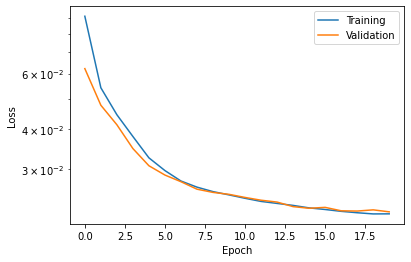

********
Fold: 3


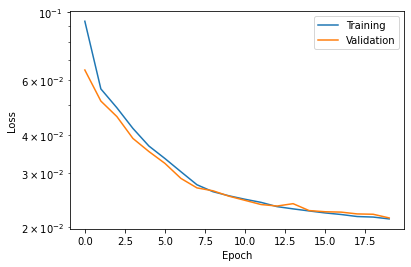

********
Loss: 0.02155041756729285
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.006
Weight decay: 3e-05
********
Fold: 1


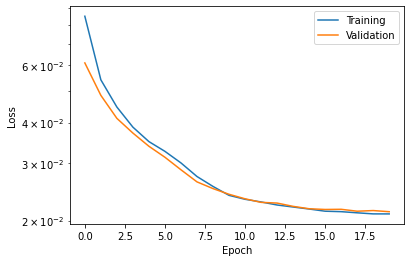

********
Fold: 2


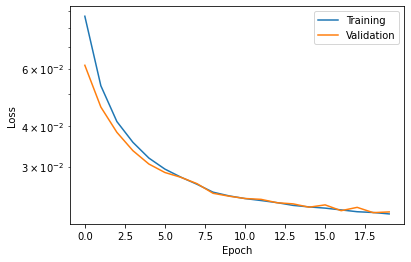

********
Fold: 3
Stop due to early stopping!


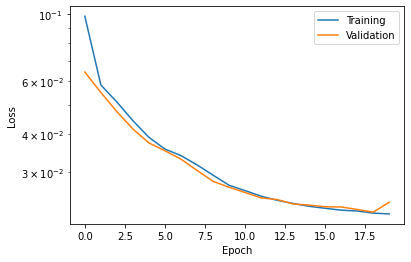

********
Loss: 0.022301625460386276
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.006
Weight decay: 6e-05
********
Fold: 1


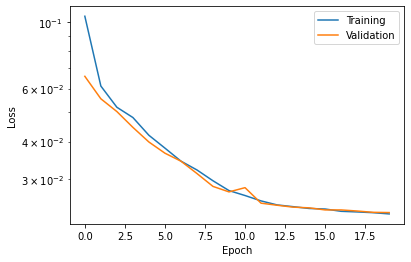

********
Fold: 2


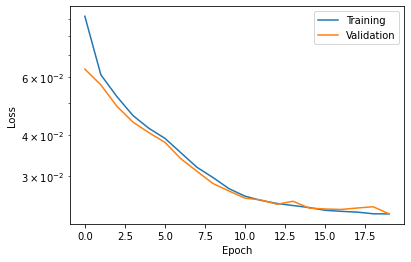

********
Fold: 3


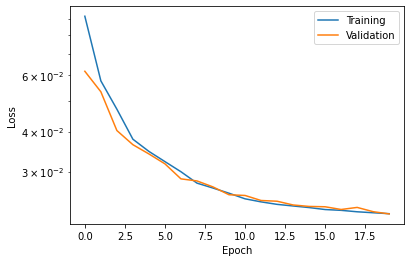

********
Loss: 0.022795118391513824
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.006
Weight decay: 0.0001
********
Fold: 1


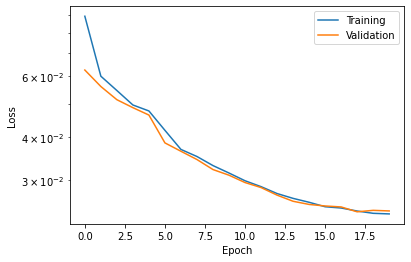

********
Fold: 2


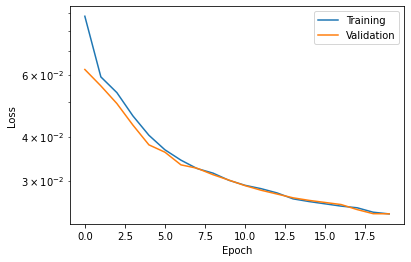

********
Fold: 3


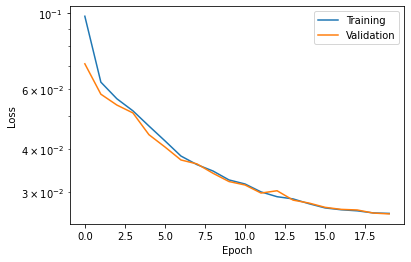

********
Loss: 0.024808128053943317
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.01
Weight decay: 1e-05
********
Fold: 1


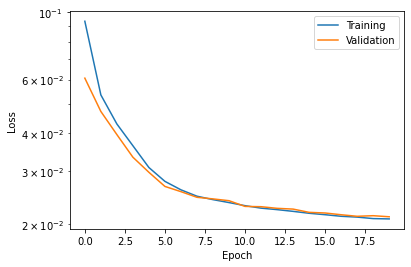

********
Fold: 2


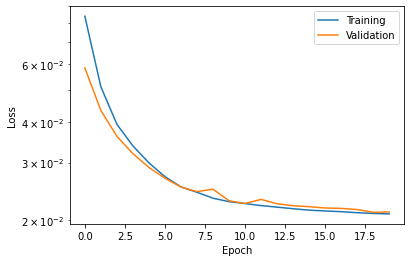

********
Fold: 3


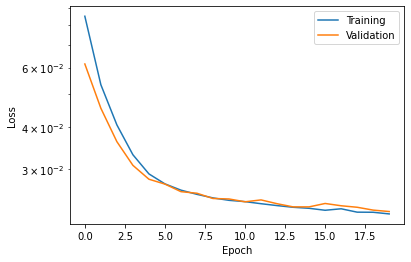

********
Loss: 0.02163909251491229
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.01
Weight decay: 3e-05
********
Fold: 1


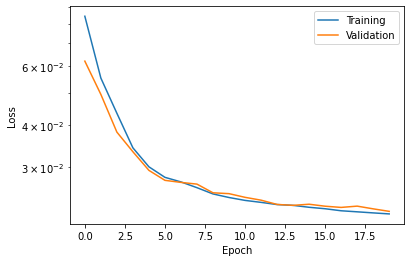

********
Fold: 2


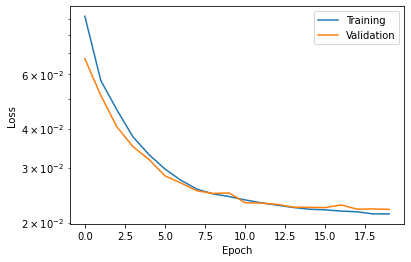

********
Fold: 3


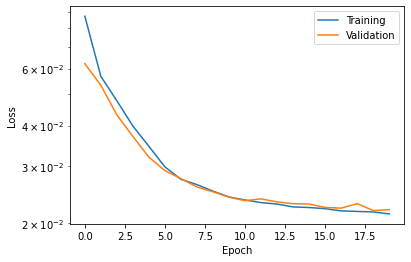

********
Loss: 0.02206244816382726
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.01
Weight decay: 6e-05
********
Fold: 1


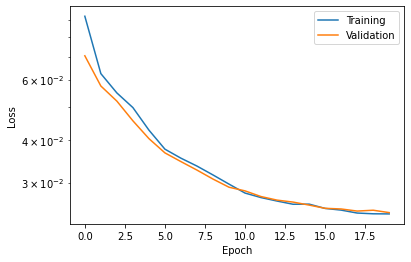

********
Fold: 2


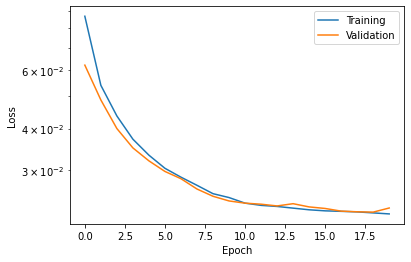

********
Fold: 3


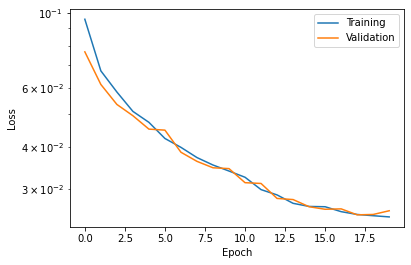

********
Loss: 0.02448708564043045
----------------------------


----------------------------
Encoded space dim:  10
Learning rate: 0.01
Weight decay: 0.0001
********
Fold: 1


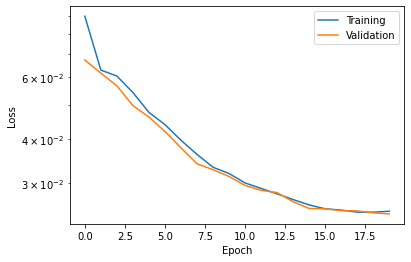

********
Fold: 2
Stop due to early stopping!


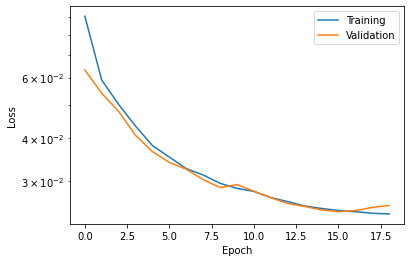

********
Fold: 3


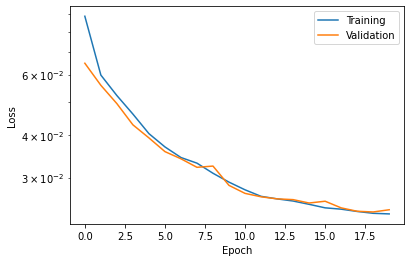

********
Loss: 0.024694778646032017
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.001
Weight decay: 1e-05
********
Fold: 1


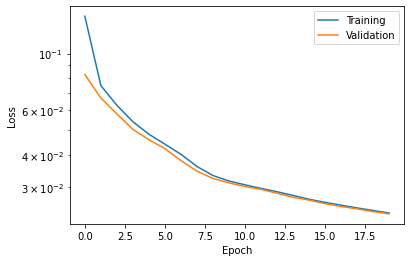

********
Fold: 2


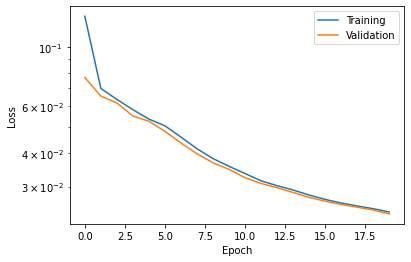

********
Fold: 3


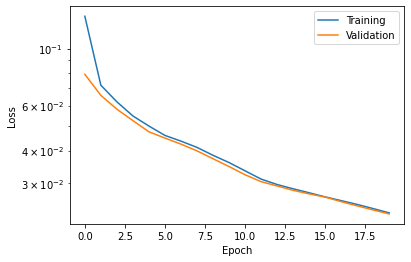

********
Loss: 0.023312241459886234
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.001
Weight decay: 3e-05
********
Fold: 1


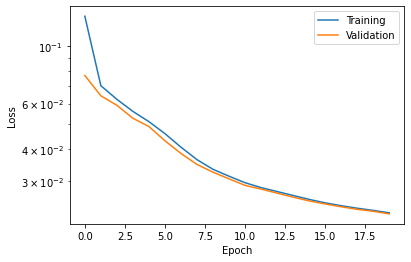

********
Fold: 2


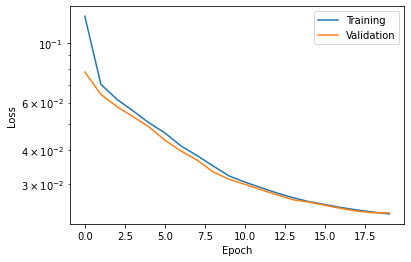

********
Fold: 3


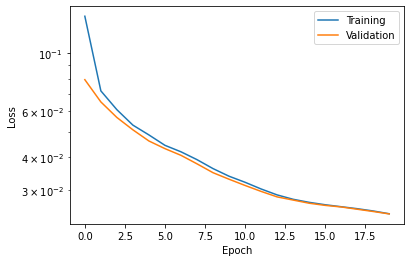

********
Loss: 0.023363980775078137
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.001
Weight decay: 6e-05
********
Fold: 1


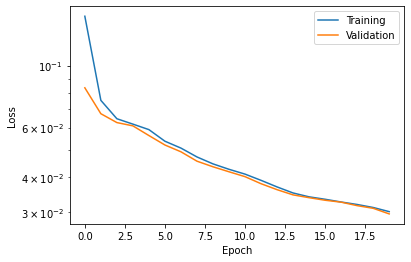

********
Fold: 2


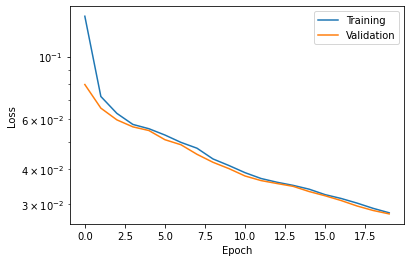

********
Fold: 3


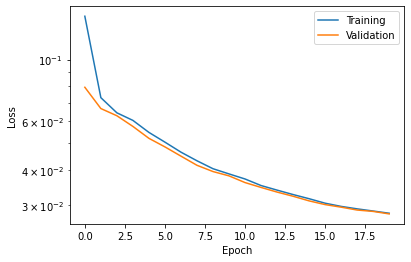

********
Loss: 0.028379979853828747
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.001
Weight decay: 0.0001
********
Fold: 1


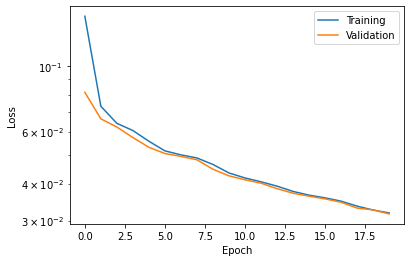

********
Fold: 2


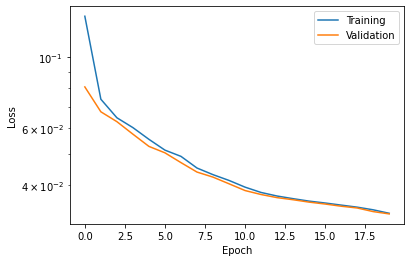

********
Fold: 3


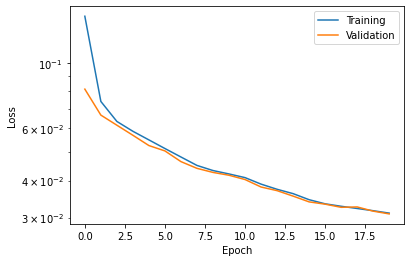

********
Loss: 0.03167043440043926
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.003
Weight decay: 1e-05
********
Fold: 1


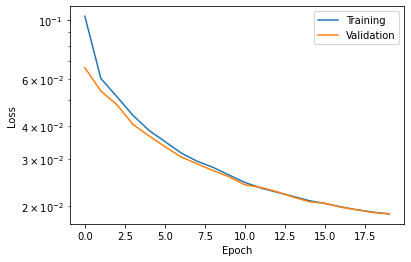

********
Fold: 2


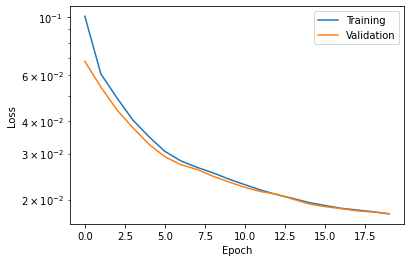

********
Fold: 3


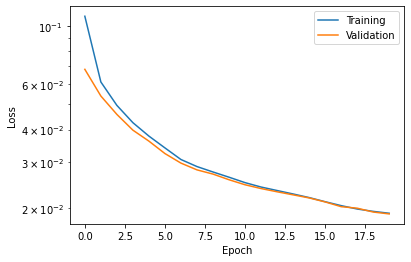

********
Loss: 0.01846761256456375
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.003
Weight decay: 3e-05
********
Fold: 1


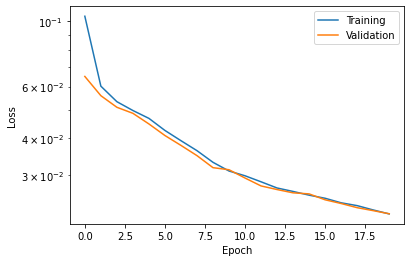

********
Fold: 2


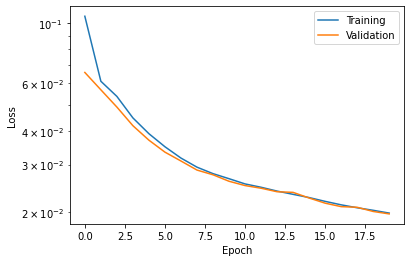

********
Fold: 3


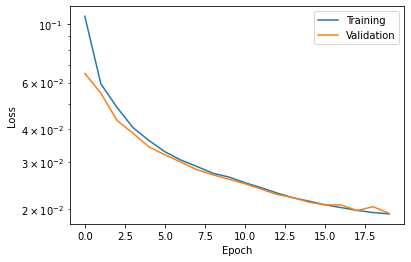

********
Loss: 0.0203774676968654
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.003
Weight decay: 6e-05
********
Fold: 1


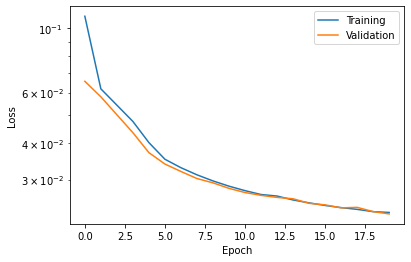

********
Fold: 2


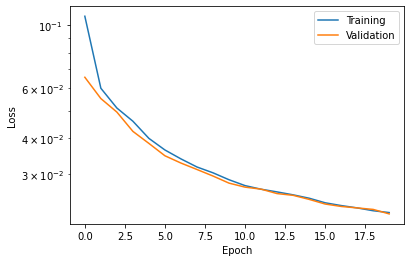

********
Fold: 3


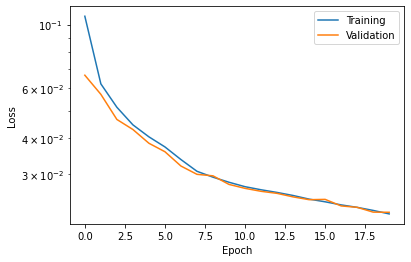

********
Loss: 0.022197252760330837
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.003
Weight decay: 0.0001
********
Fold: 1


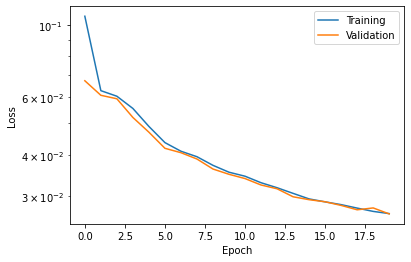

********
Fold: 2


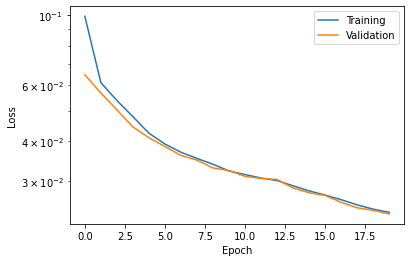

********
Fold: 3


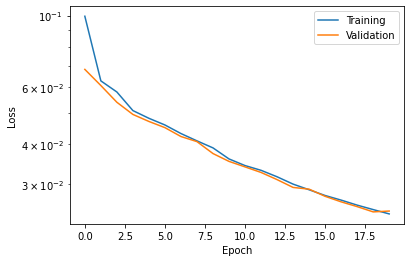

********
Loss: 0.024953648447990417
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.006
Weight decay: 1e-05
********
Fold: 1


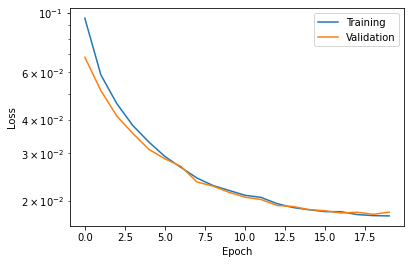

********
Fold: 2


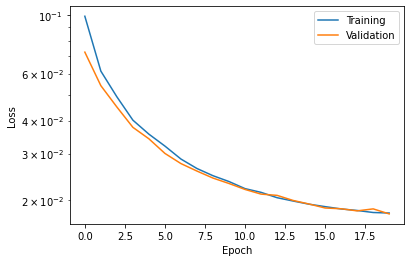

********
Fold: 3


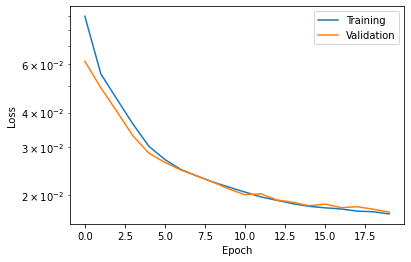

********
Loss: 0.017738060404857
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.006
Weight decay: 3e-05
********
Fold: 1


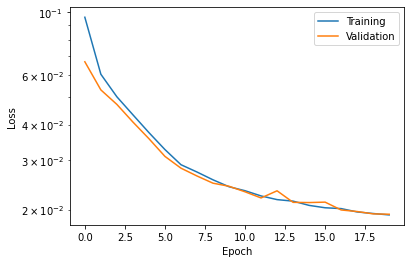

********
Fold: 2


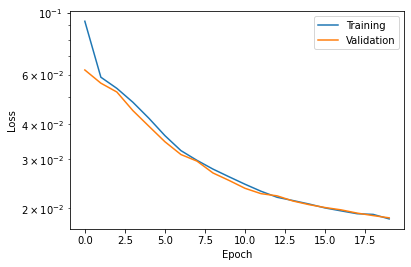

********
Fold: 3


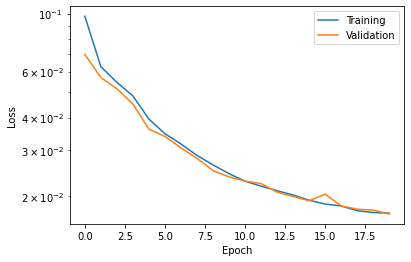

********
Loss: 0.01829233082632224
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.006
Weight decay: 6e-05
********
Fold: 1


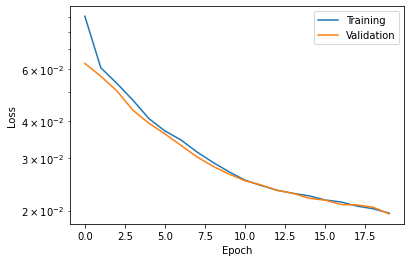

********
Fold: 2


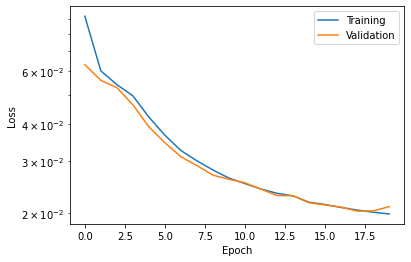

********
Fold: 3


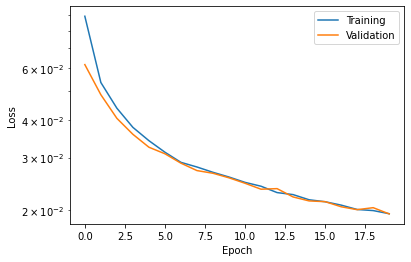

********
Loss: 0.019992488746841747
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.006
Weight decay: 0.0001
********
Fold: 1


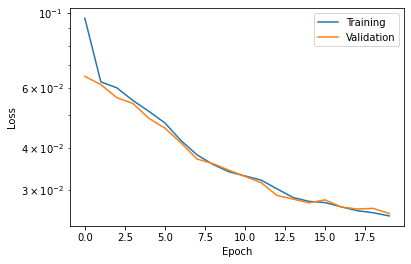

********
Fold: 2


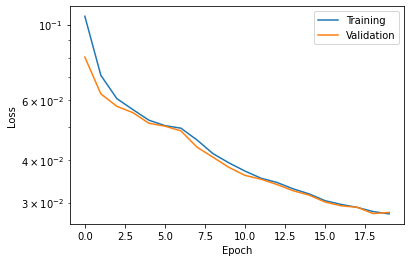

********
Fold: 3


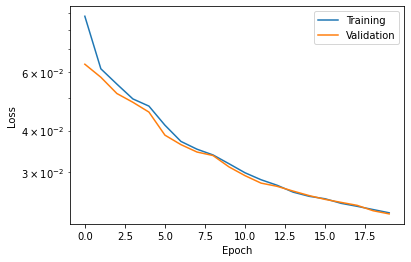

********
Loss: 0.02538370278974374
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.01
Weight decay: 1e-05
********
Fold: 1


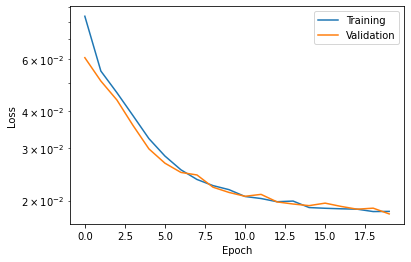

********
Fold: 2


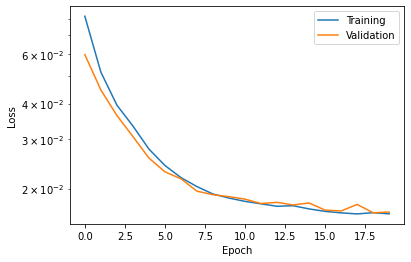

********
Fold: 3


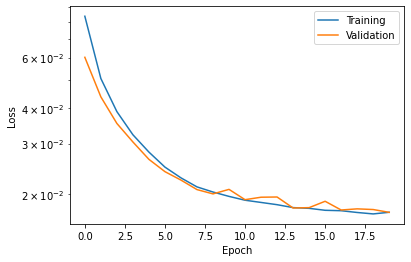

********
Loss: 0.017270388702551525
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.01
Weight decay: 3e-05
********
Fold: 1


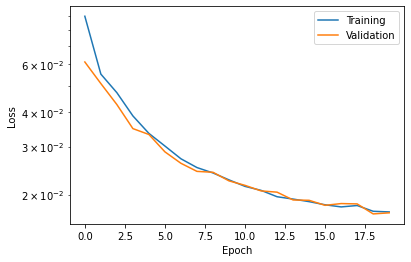

********
Fold: 2
Stop due to early stopping!


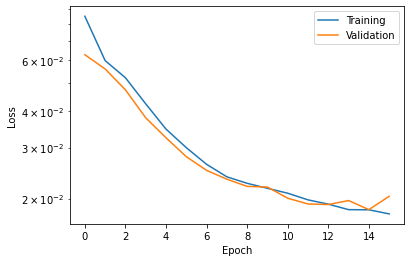

********
Fold: 3


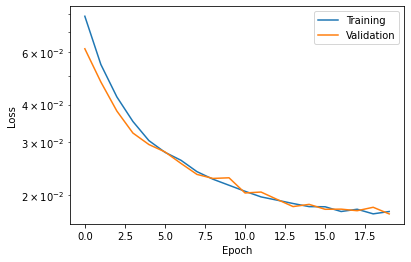

********
Loss: 0.018285540242989857
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.01
Weight decay: 6e-05
********
Fold: 1


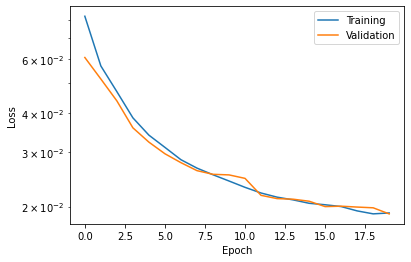

********
Fold: 2


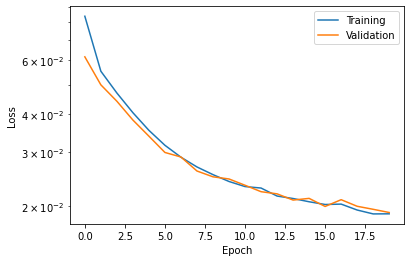

********
Fold: 3


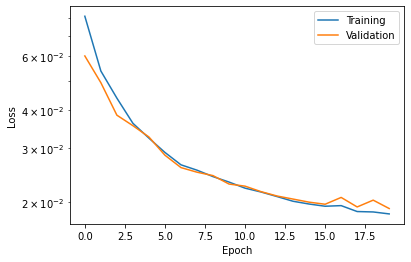

********
Loss: 0.0190071618805329
----------------------------


----------------------------
Encoded space dim:  16
Learning rate: 0.01
Weight decay: 0.0001
********
Fold: 1


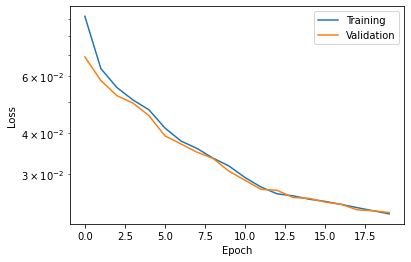

********
Fold: 2


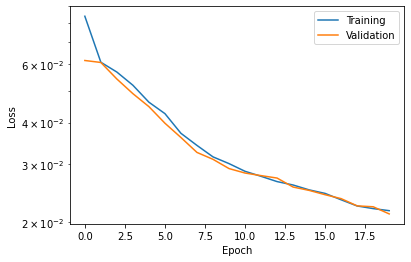

********
Fold: 3


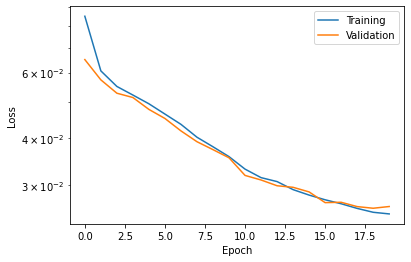

********
Loss: 0.023394784579674404
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.001
Weight decay: 1e-05
********
Fold: 1


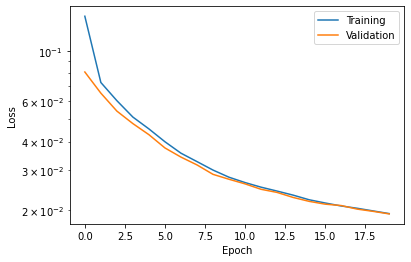

********
Fold: 2


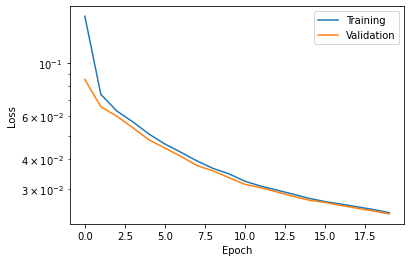

********
Fold: 3


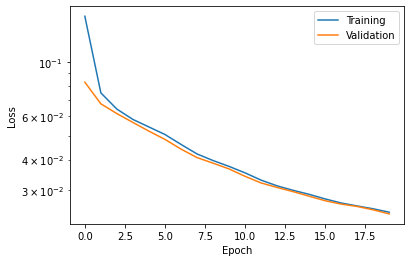

********
Loss: 0.02233137811223666
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.001
Weight decay: 3e-05
********
Fold: 1


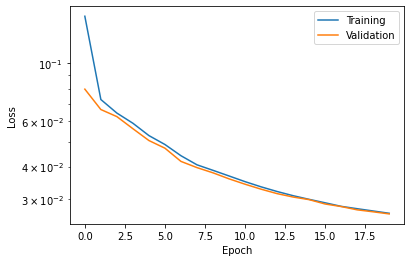

********
Fold: 2


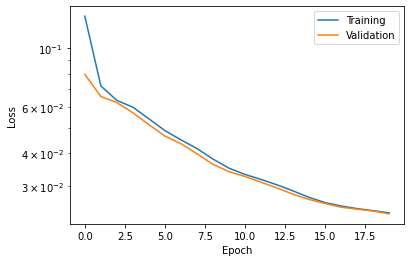

********
Fold: 3


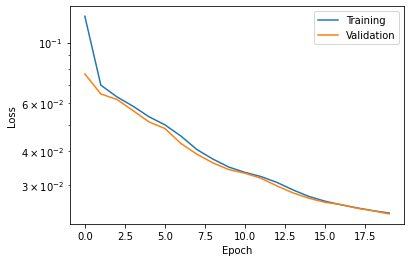

********
Loss: 0.02447279045979182
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.001
Weight decay: 6e-05
********
Fold: 1


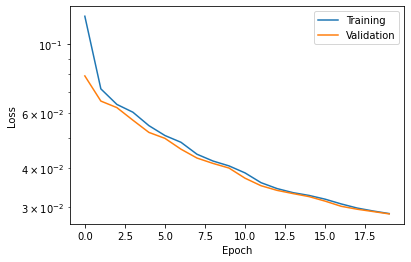

********
Fold: 2


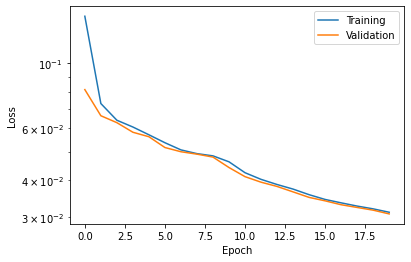

********
Fold: 3


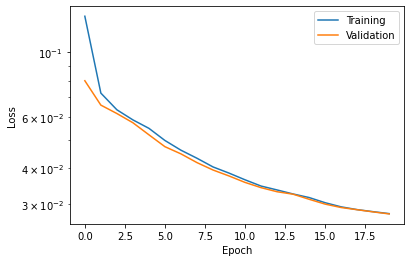

********
Loss: 0.0290392463405927
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.001
Weight decay: 0.0001
********
Fold: 1


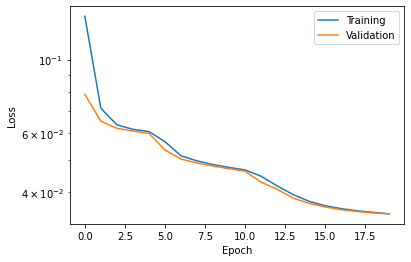

********
Fold: 2


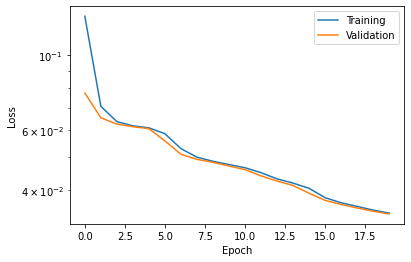

********
Fold: 3


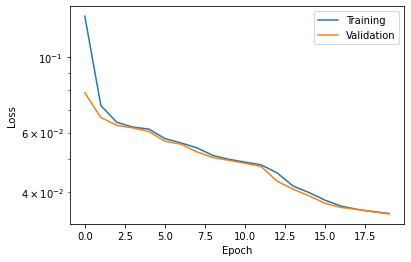

********
Loss: 0.03432285413146019
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.003
Weight decay: 1e-05
********
Fold: 1


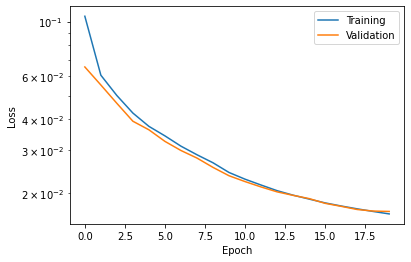

********
Fold: 2


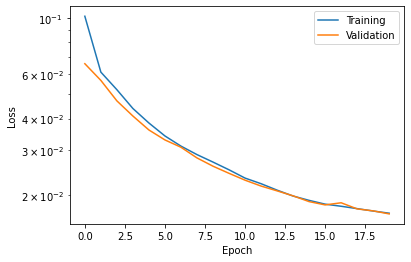

********
Fold: 3


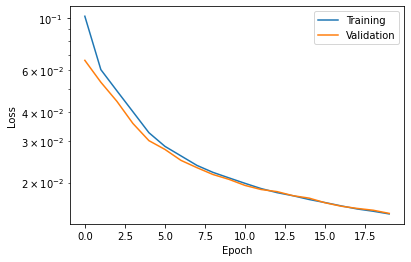

********
Loss: 0.016170393365124863
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.003
Weight decay: 3e-05
********
Fold: 1


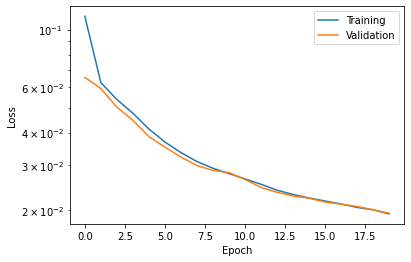

********
Fold: 2


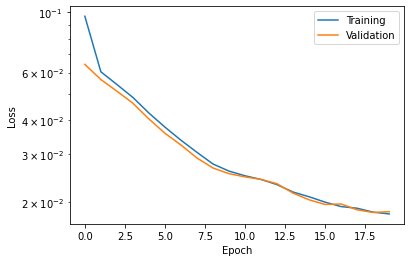

********
Fold: 3


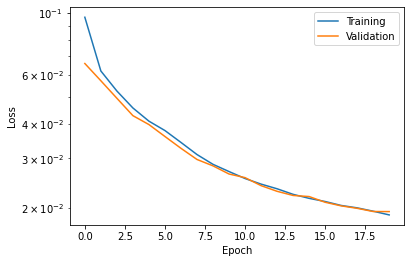

********
Loss: 0.01910344697535038
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.003
Weight decay: 6e-05
********
Fold: 1


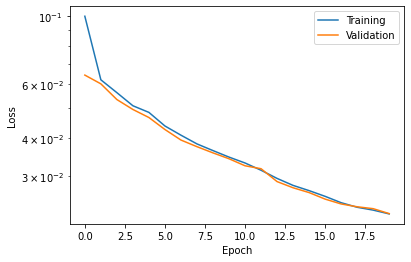

********
Fold: 2


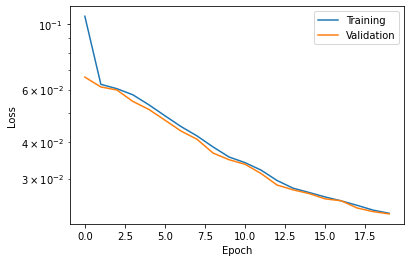

********
Fold: 3


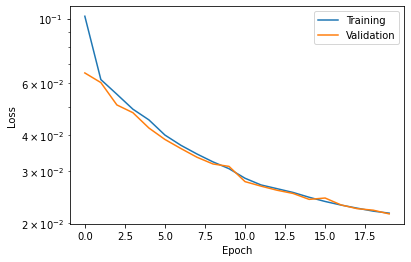

********
Loss: 0.022290271396438282
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.003
Weight decay: 0.0001
********
Fold: 1


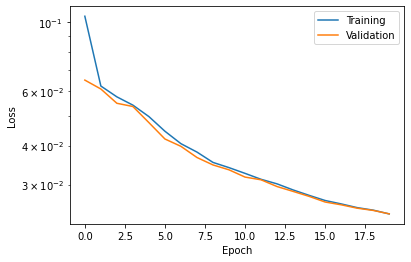

********
Fold: 2


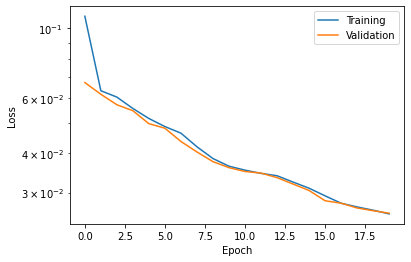

********
Fold: 3


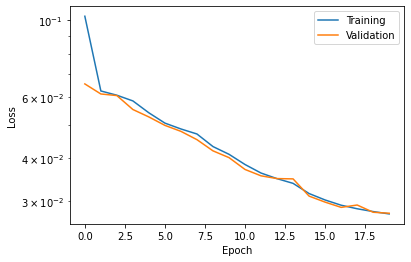

********
Loss: 0.02589297356704871
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.006
Weight decay: 1e-05
********
Fold: 1


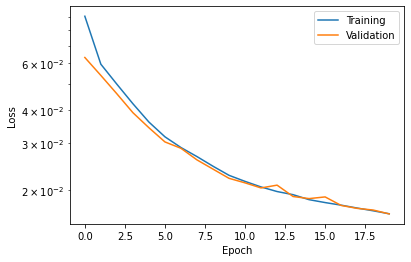

********
Fold: 2


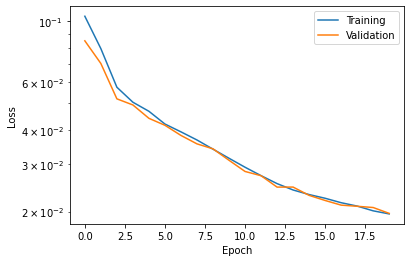

********
Fold: 3


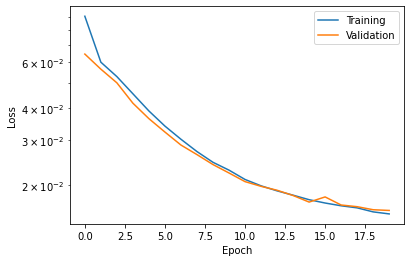

********
Loss: 0.01731165312230587
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.006
Weight decay: 3e-05
********
Fold: 1


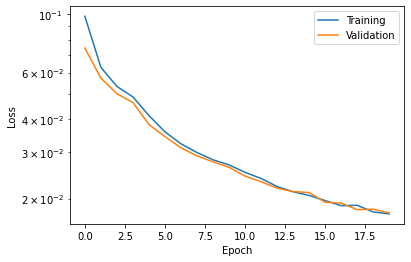

********
Fold: 2


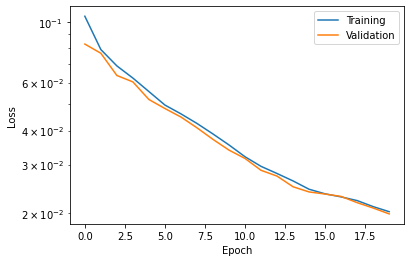

********
Fold: 3


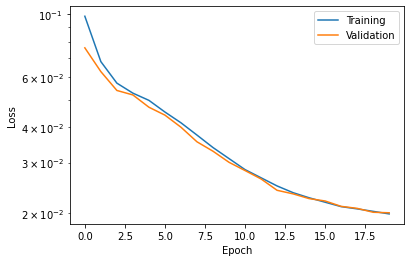

********
Loss: 0.019150468210379284
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.006
Weight decay: 6e-05
********
Fold: 1


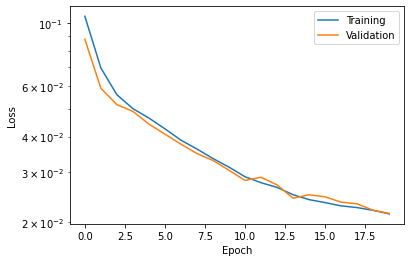

********
Fold: 2


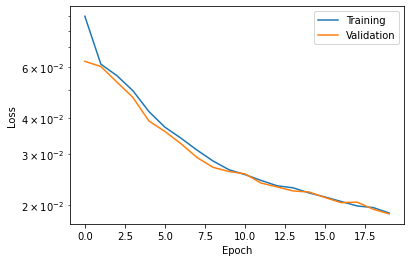

********
Fold: 3


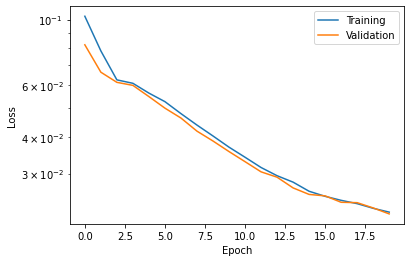

********
Loss: 0.020669516175985336
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.006
Weight decay: 0.0001
********
Fold: 1


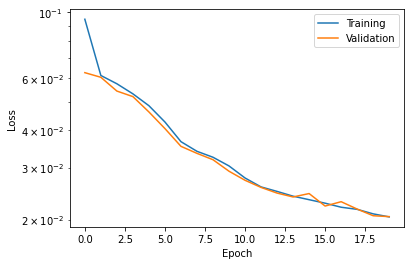

********
Fold: 2


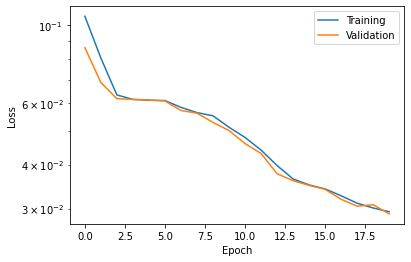

********
Fold: 3


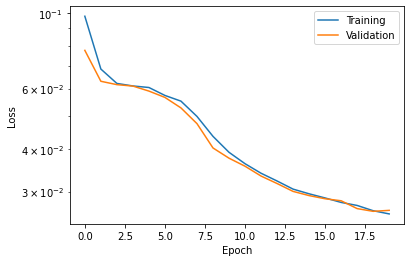

********
Loss: 0.025298598532875378
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.01
Weight decay: 1e-05
********
Fold: 1


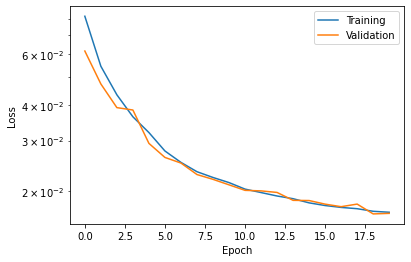

********
Fold: 2


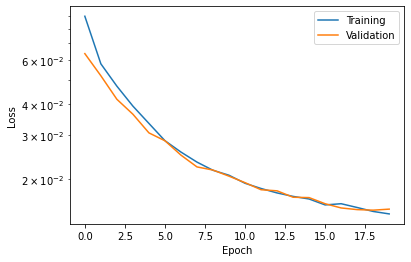

********
Fold: 3


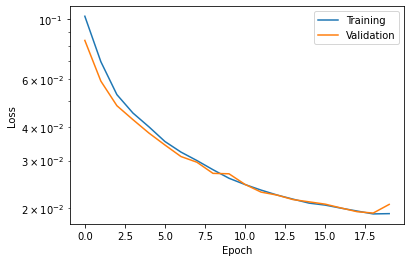

********
Loss: 0.017510059910515945
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.01
Weight decay: 3e-05
********
Fold: 1


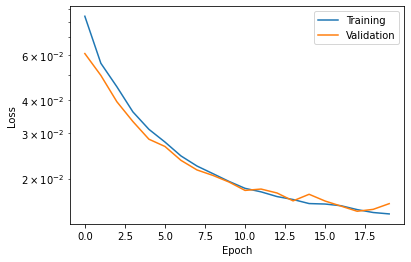

********
Fold: 2


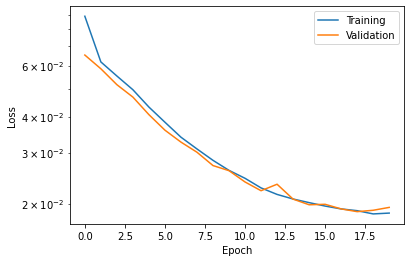

********
Fold: 3


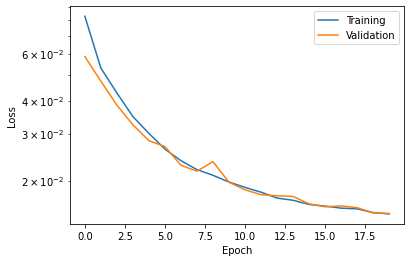

********
Loss: 0.01682550149659316
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.01
Weight decay: 6e-05
********
Fold: 1


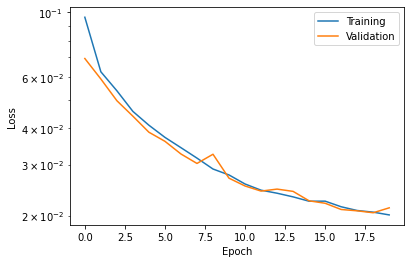

********
Fold: 2


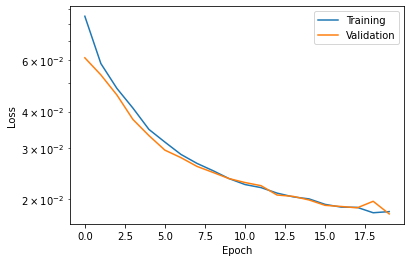

********
Fold: 3


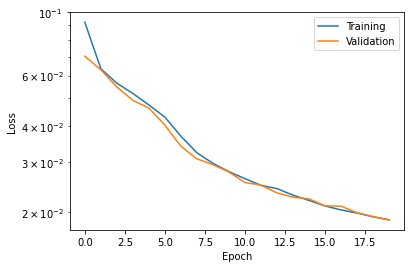

********
Loss: 0.01931655655304591
----------------------------


----------------------------
Encoded space dim:  32
Learning rate: 0.01
Weight decay: 0.0001
********
Fold: 1


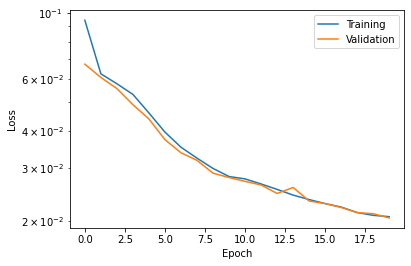

********
Fold: 2


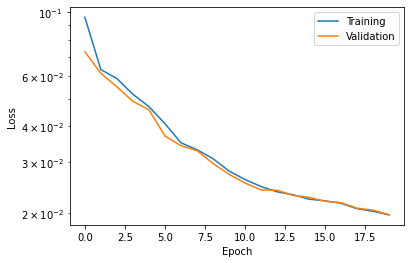

********
Fold: 3


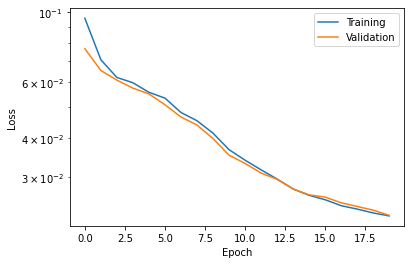

********
Loss: 0.02094677897791068
----------------------------


Best configuration is :

encoded dim :  32 

learning rate : 0.003 

weight decay : 1e-05 

loss : 0.016170393365124863 



In [ ]:
#very long training...

params={"enc":[2,6,10,16,32],
        "lr":[1e-3,3e-3,6e-3,1e-2],
        "w_d":[1e-5,3e-5,6e-5,1e-4]
        }

best_configuration=grid_search(par=params,data_train=data_train)

## training with best parameters

EPOCH 2/100
TRAINING - EPOCH 2/100 - loss: 0.053834
TEST - EPOCH 2/100 - loss: 0.046782


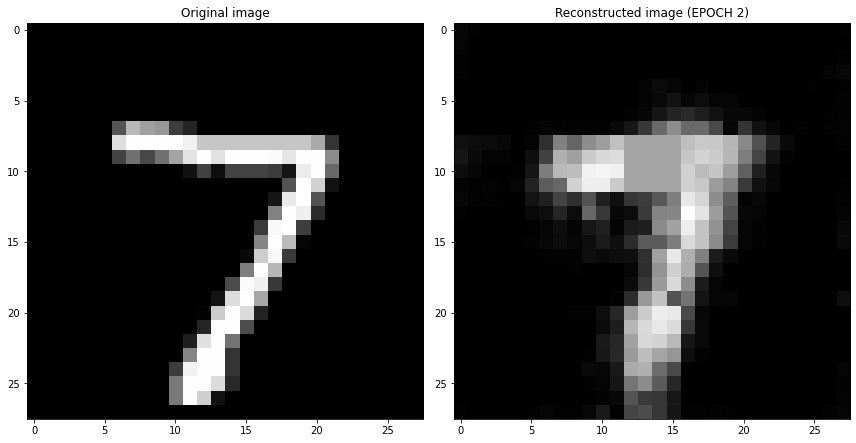

EPOCH 4/100
TRAINING - EPOCH 4/100 - loss: 0.033717
TEST - EPOCH 4/100 - loss: 0.030069


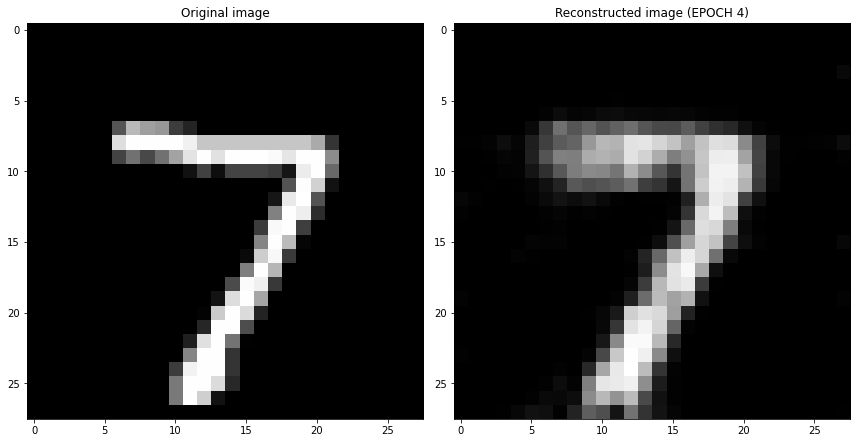

EPOCH 6/100
TRAINING - EPOCH 6/100 - loss: 0.024515
TEST - EPOCH 6/100 - loss: 0.022887


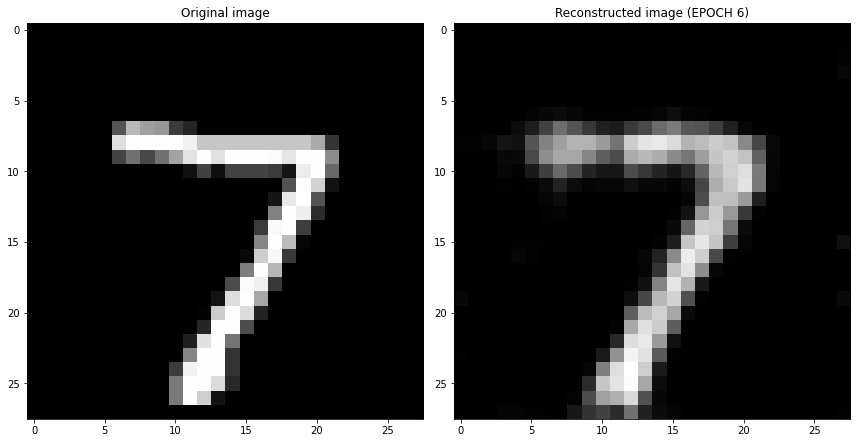

EPOCH 8/100
TRAINING - EPOCH 8/100 - loss: 0.020054
TEST - EPOCH 8/100 - loss: 0.019120


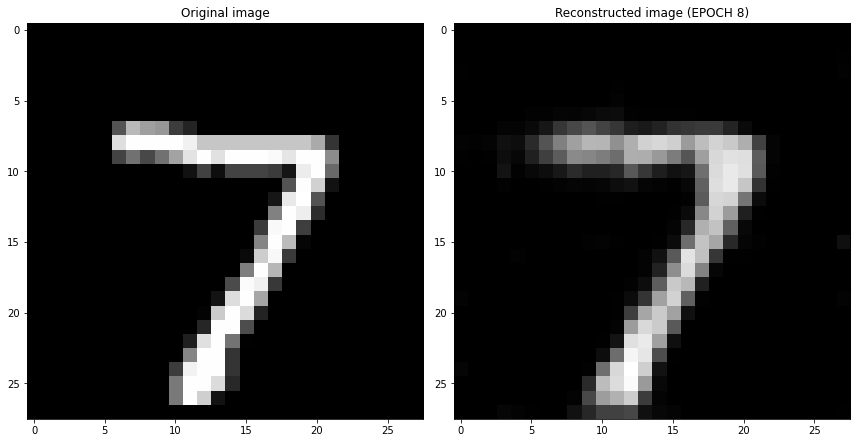

EPOCH 10/100
TRAINING - EPOCH 10/100 - loss: 0.017898
TEST - EPOCH 10/100 - loss: 0.016992


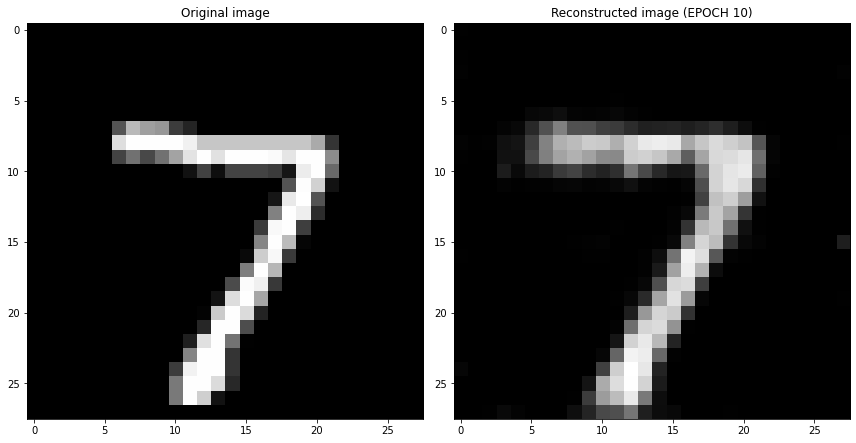

EPOCH 12/100
TRAINING - EPOCH 12/100 - loss: 0.016271
TEST - EPOCH 12/100 - loss: 0.015646


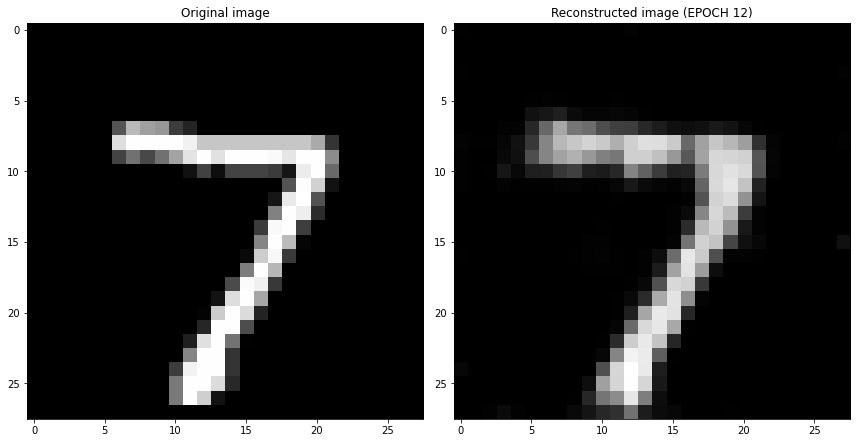

EPOCH 14/100
TRAINING - EPOCH 14/100 - loss: 0.015119
TEST - EPOCH 14/100 - loss: 0.014925


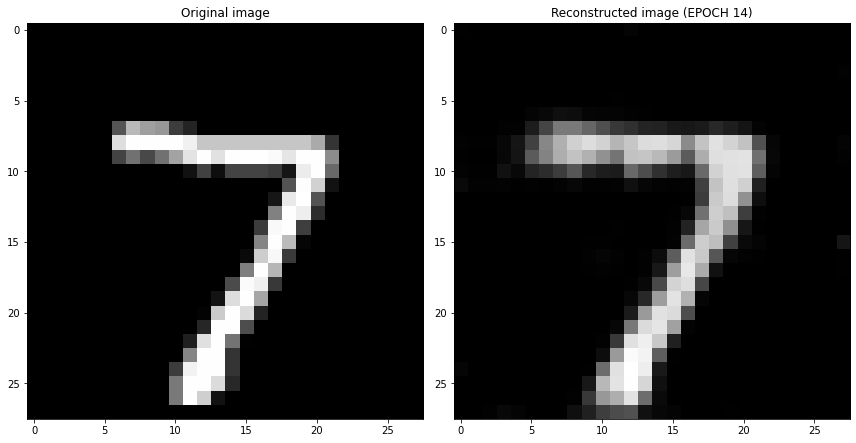

EPOCH 16/100
TRAINING - EPOCH 16/100 - loss: 0.014353
TEST - EPOCH 16/100 - loss: 0.013851


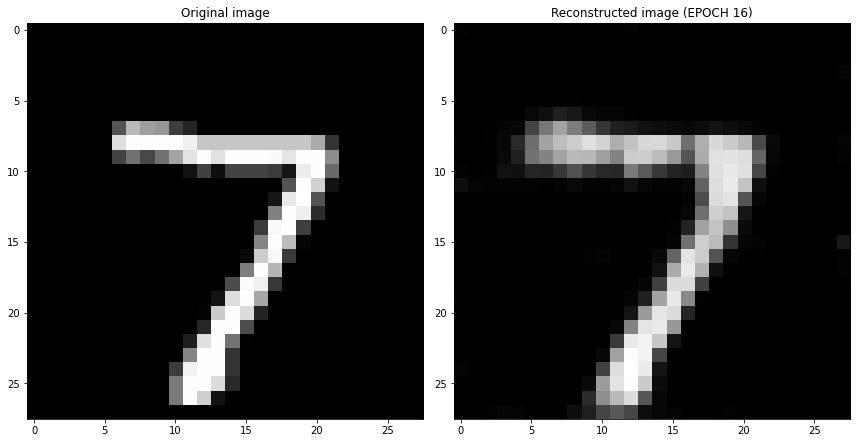

EPOCH 18/100
TRAINING - EPOCH 18/100 - loss: 0.013671
TEST - EPOCH 18/100 - loss: 0.013246


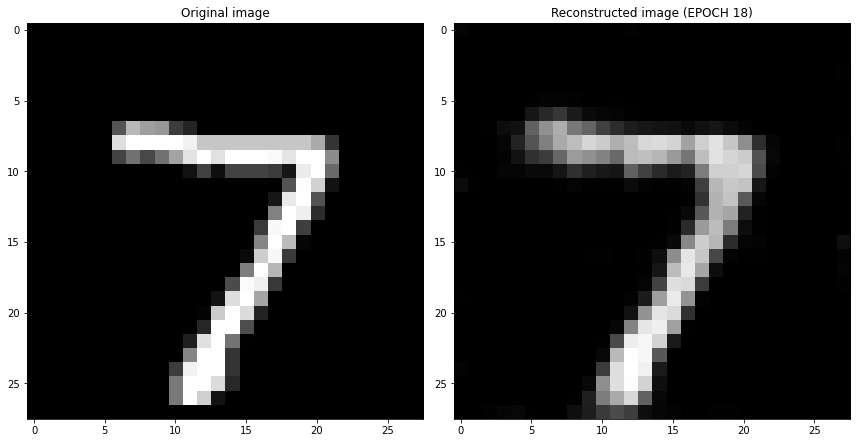

EPOCH 20/100
TRAINING - EPOCH 20/100 - loss: 0.013128
TEST - EPOCH 20/100 - loss: 0.012668


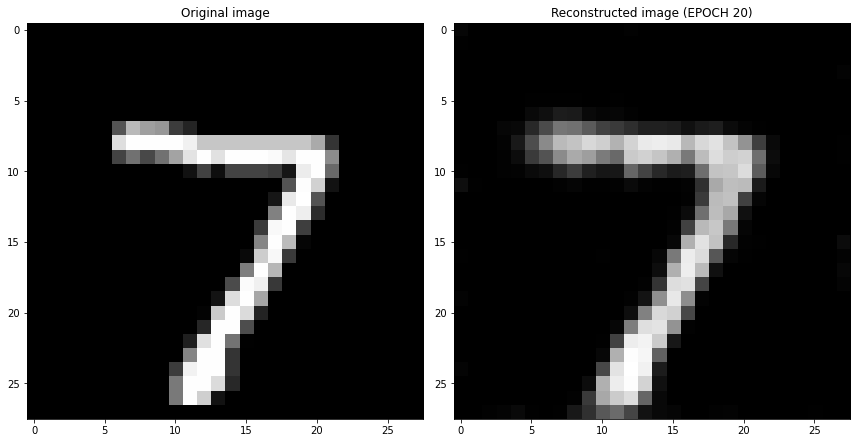

EPOCH 22/100
TRAINING - EPOCH 22/100 - loss: 0.012484
TEST - EPOCH 22/100 - loss: 0.012277


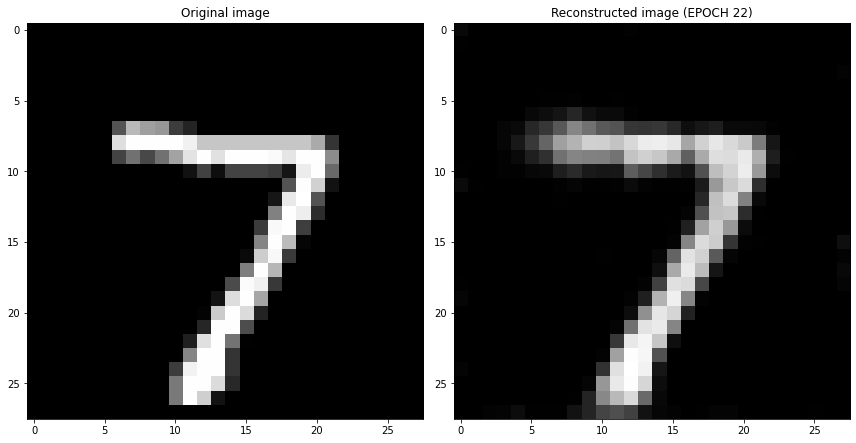

EPOCH 24/100
TRAINING - EPOCH 24/100 - loss: 0.012067
TEST - EPOCH 24/100 - loss: 0.011782


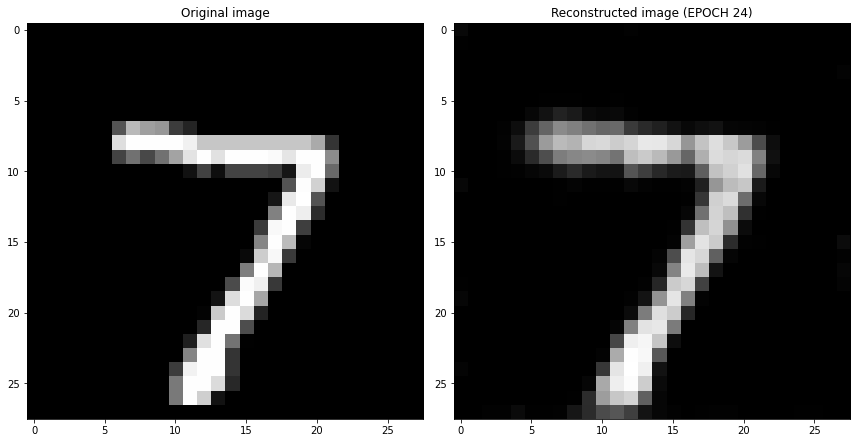

EPOCH 26/100
TRAINING - EPOCH 26/100 - loss: 0.011716
TEST - EPOCH 26/100 - loss: 0.011373


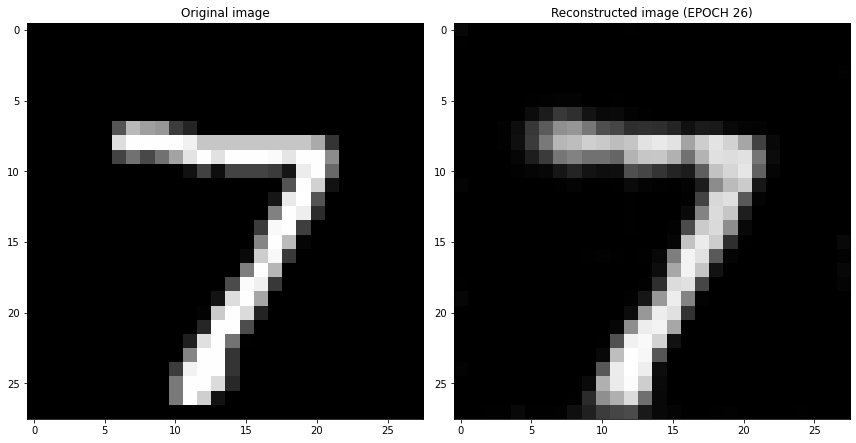

EPOCH 28/100
TRAINING - EPOCH 28/100 - loss: 0.011345
TEST - EPOCH 28/100 - loss: 0.010938


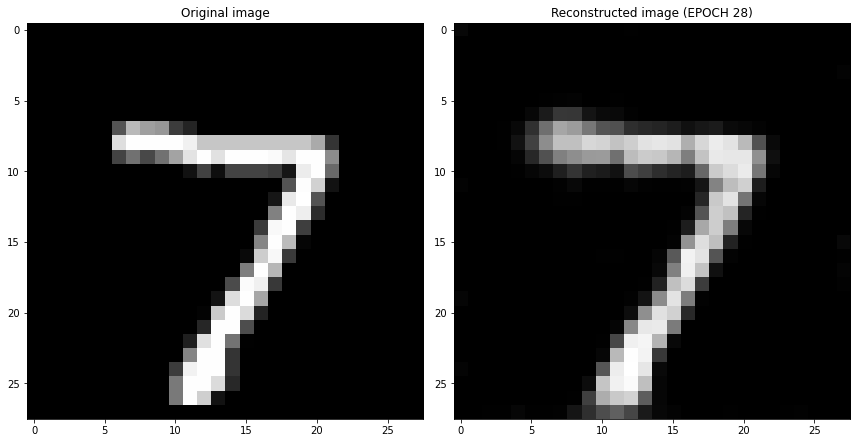

EPOCH 30/100
TRAINING - EPOCH 30/100 - loss: 0.010988
TEST - EPOCH 30/100 - loss: 0.010700


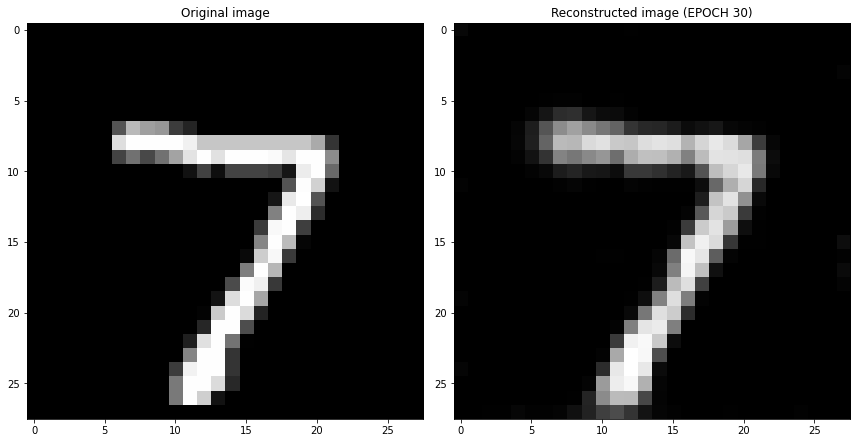

EPOCH 32/100
TRAINING - EPOCH 32/100 - loss: 0.010718
TEST - EPOCH 32/100 - loss: 0.010401


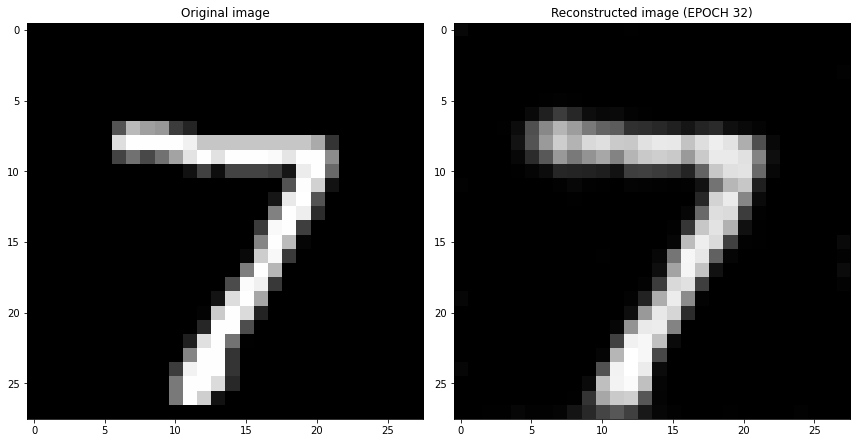

EPOCH 34/100
TRAINING - EPOCH 34/100 - loss: 0.010532
TEST - EPOCH 34/100 - loss: 0.010450


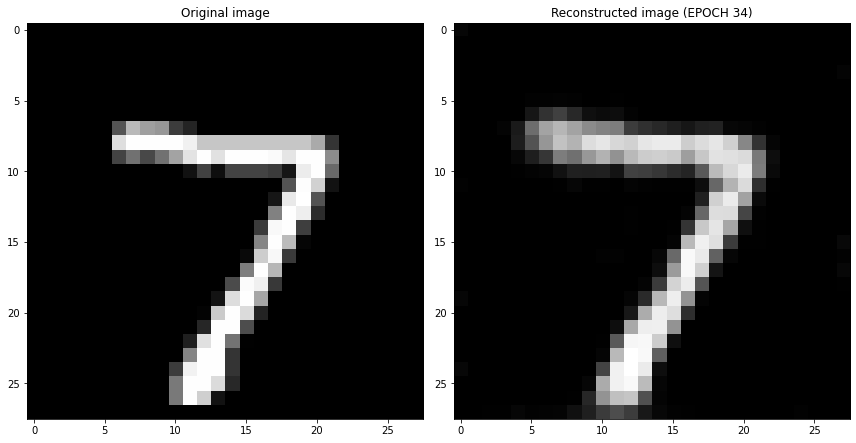

EPOCH 36/100
TRAINING - EPOCH 36/100 - loss: 0.010381
TEST - EPOCH 36/100 - loss: 0.010057


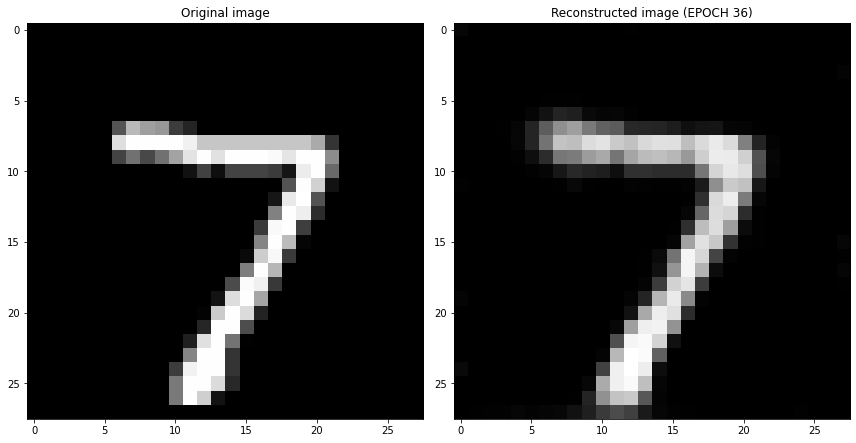

EPOCH 38/100
TRAINING - EPOCH 38/100 - loss: 0.010413
TEST - EPOCH 38/100 - loss: 0.009972


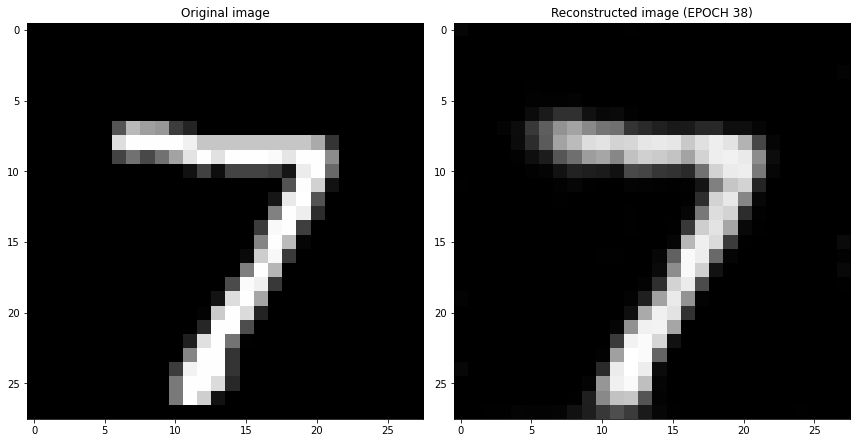

EPOCH 40/100
TRAINING - EPOCH 40/100 - loss: 0.010141
TEST - EPOCH 40/100 - loss: 0.009885


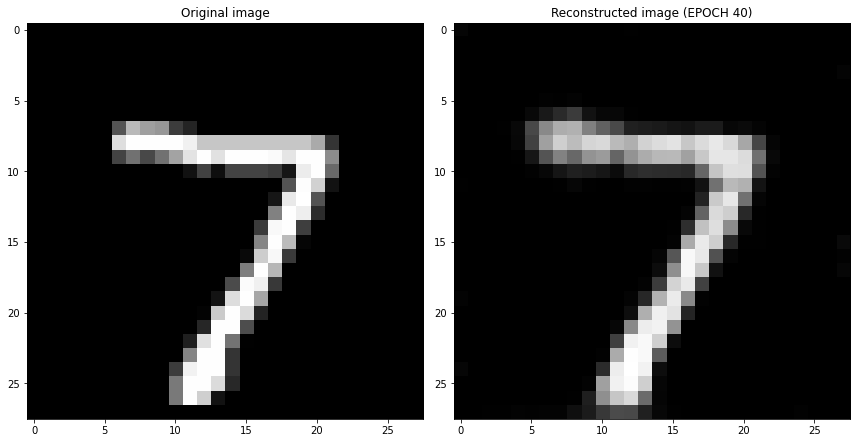

EPOCH 42/100
TRAINING - EPOCH 42/100 - loss: 0.010082
TEST - EPOCH 42/100 - loss: 0.009740


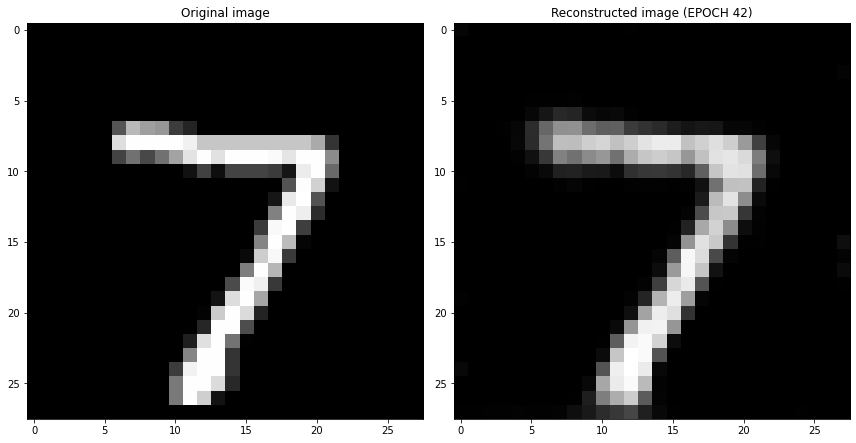

EPOCH 44/100
TRAINING - EPOCH 44/100 - loss: 0.009968
TEST - EPOCH 44/100 - loss: 0.009655


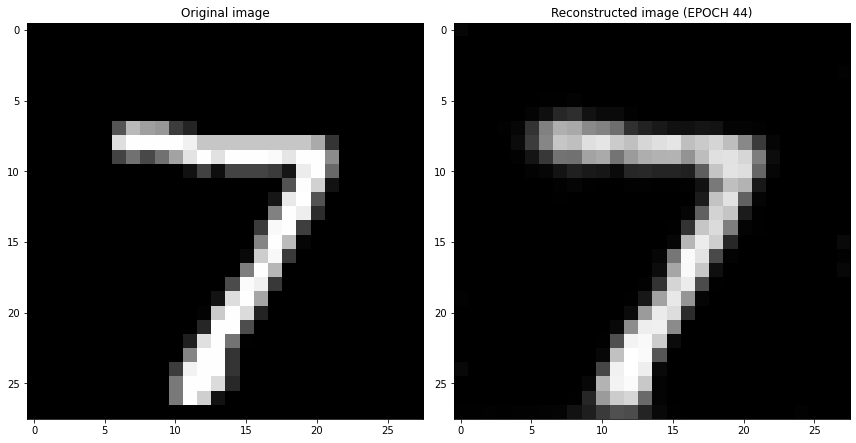

EPOCH 46/100
TRAINING - EPOCH 46/100 - loss: 0.009787
TEST - EPOCH 46/100 - loss: 0.009440


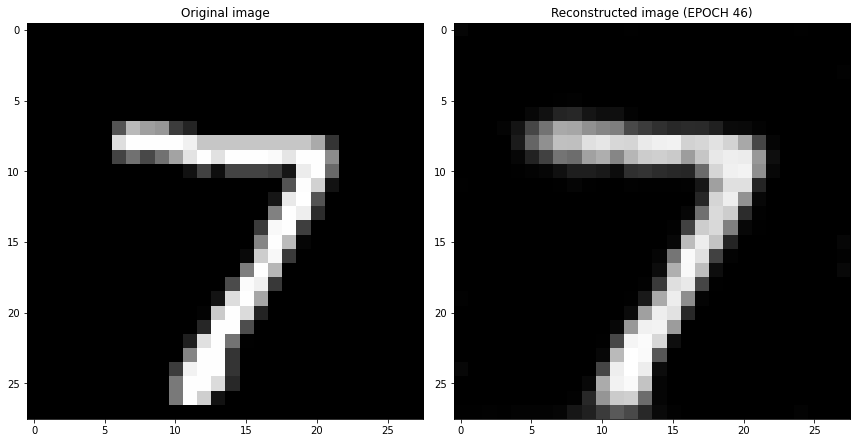

EPOCH 48/100
TRAINING - EPOCH 48/100 - loss: 0.009708
TEST - EPOCH 48/100 - loss: 0.009374


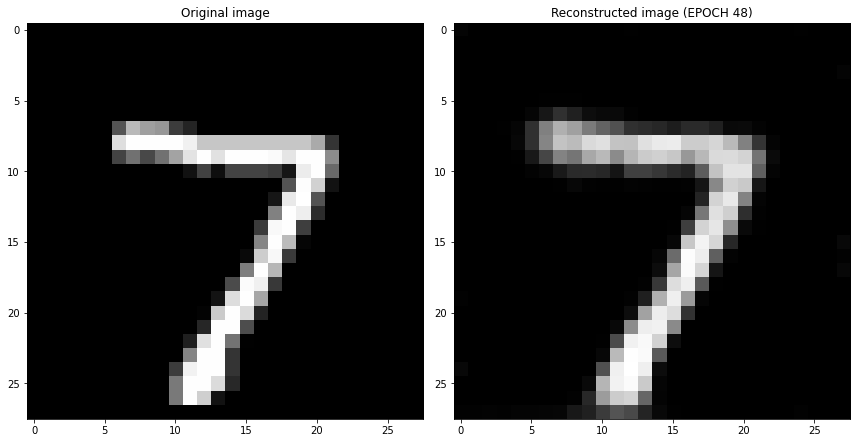

EPOCH 50/100
TRAINING - EPOCH 50/100 - loss: 0.009604
TEST - EPOCH 50/100 - loss: 0.009234


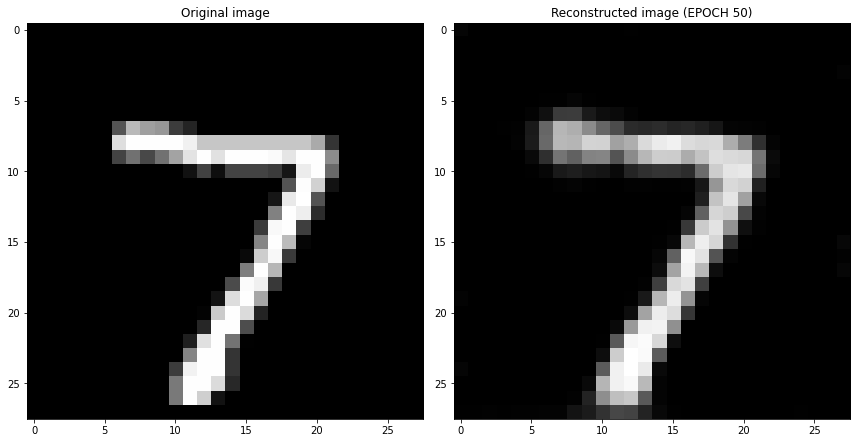

EPOCH 52/100
TRAINING - EPOCH 52/100 - loss: 0.009536
TEST - EPOCH 52/100 - loss: 0.011829


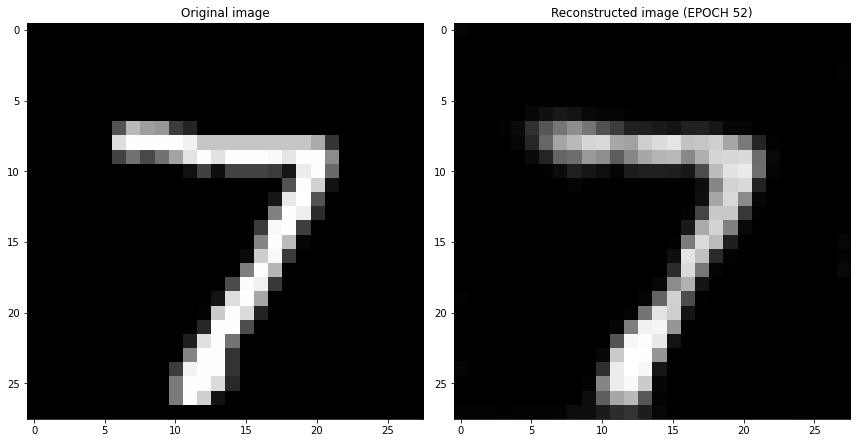

Stop due to early stopping!


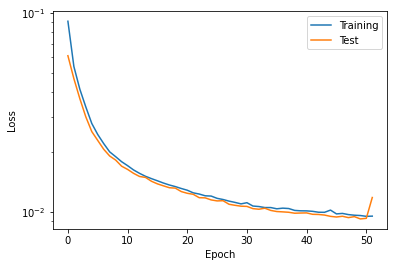

In [ ]:

# Define the network 
net = AutoEncoder_HP(encoded_space_dim=best_configuration[0])
net.to(device)
# Define the optimizer
best_optimizer = torch.optim.Adam(net.parameters(), lr=best_configuration[1], weight_decay=best_configuration[2])
# Define loss function
loss_fn = torch.nn.MSELoss()

#dataloader
train_dataloader = DataLoader(data_train, batch_size=512, shuffle=True)
test_dataloader = DataLoader(data_test, batch_size=512, shuffle=False)

#training best configuration and save=True
training_best=training(net, train_dataloader, test_dataloader,encoded_space_dim=best_configuration[0], loss_fn=loss_fn,
        optimizer=best_optimizer, num_epochs=100,patience=10,save=True,test=True)

## Loading best parameter from "best_net_params.pth" after very long training

In [ ]:
best_configuration=[32,3e-3,1e-5]
# Define the network 
net = AutoEncoder_HP(encoded_space_dim=best_configuration[0])
# Define the optimizer
best_optimizer = torch.optim.Adam(net.parameters(), lr=best_configuration[1], weight_decay=best_configuration[2])


In [ ]:
# Load network parameters    
net.load_state_dict(torch.load("/content/drive/MyDrive/homework2_NNDL/best_net_params.pth", map_location=str(device)))
net.to(device)

AutoEncoder_HP(
  (encoder): Sequential(
    (0): Conv2d(1, 8, kernel_size=(8, 8), stride=(4, 4))
    (1): ReLU(inplace=True)
    (2): Flatten(start_dim=1, end_dim=-1)
    (3): Linear(in_features=288, out_features=64, bias=True)
    (4): ReLU(inplace=True)
    (5): Linear(in_features=64, out_features=32, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=32, out_features=64, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=64, out_features=288, bias=True)
    (3): ReLU(inplace=True)
    (4): Unflatten(dim=1, unflattened_size=(8, 6, 6))
    (5): ConvTranspose2d(8, 1, kernel_size=(8, 8), stride=(4, 4))
    (6): Sigmoid()
  )
)

# **Testing images recostruction**

## Noised images

In [ ]:
def gaussian_noise_data(dataset,shape_img,mean,std):

  gn_dataset=[]

  for i in range(len(dataset)):
    img,label=dataset[i]
    corrupted_img=img+torch.tensor(np.random.normal(mean,std,size=shape_img),dtype=torch.float32)
    
    gn_dataset.append( (corrupted_img,label) )

  return(gn_dataset)

def obscured_images(dataset,shape_img,dim):

  shape_x=shape_img[0]-1
  shape_y=shape_img[1]-1

  oi_dataset=[]

  for i in range(len(dataset)):
    img,label=dataset[i]
    
    x=np.random.randint(0,shape_x+1)
    y=np.random.randint(0,shape_y+1)

    if x+dim > shape_x and y+dim <= shape_y:
      x_remain=x+dim-shape_x
      img[:,x:shape_x+1,y:y+dim+1]=1
      img[:,0:x_remain+1,y:y+dim+1]=1

    if x+dim <= shape_x and y+dim > shape_y :
      y_remain=y+dim-shape_y
      img[:,x:x+dim+1,y:shape_y+1]=1
      img[:,x:x+dim+1,0:y_remain+1]=1
    
    if x+dim <= shape_x and y+dim <= shape_y :
      img[:,x:x+dim+1,y:y+dim+1]=1

    if x+dim > shape_x and y+dim > shape_y:
      x_remain=x+dim-shape_x
      y_remain=y+dim-shape_y
      img[:,x:shape_x+1,y:shape_y+1]=1
      img[:,0:x_remain+1,0:y_remain+1]=1

    oi_dataset.append( ( img,label) )

  return(oi_dataset)
  

In [ ]:
noisy_img=gaussian_noise_data(data_test,(28,28),mean=0,std=0.2)


In [ ]:
obs_img=obscured_images(data_test,(28,28),5)


In [ ]:
# Build dataloader
test_dataloader = DataLoader(data_test,  batch_size=512, shuffle=False)
gn_img_dataloader = DataLoader(noisy_img,  batch_size=512, shuffle=False)
obs_img_dataloader = DataLoader(obs_img,  batch_size=512, shuffle=False)

In [ ]:
# Define loss function
loss_fn = torch.nn.MSELoss()


# Test on the original images
test_loss = test_epoch(net, test_dataloader, loss_fn)
# Gaussian
gn_img_loss = test_epoch(net, gn_img_dataloader, loss_fn)
# Broken
obs_img_loss = test_epoch(net, obs_img_dataloader, loss_fn)

In [ ]:
print('-------------------------------------------------------')
print('Loss on normal test dataset:',test_loss)
print('Loss on gaussian test dataset:',gn_img_loss)
print('Loss on broken test dataset:',obs_img_loss)
print('-------------------------------------------------------')

-------------------------------------------------------
Loss on normal test dataset: 0.011829222552478313
Loss on gaussian test dataset: 0.053403276950120926
Loss on broken test dataset: 0.045766595751047134
-------------------------------------------------------


## Just an example

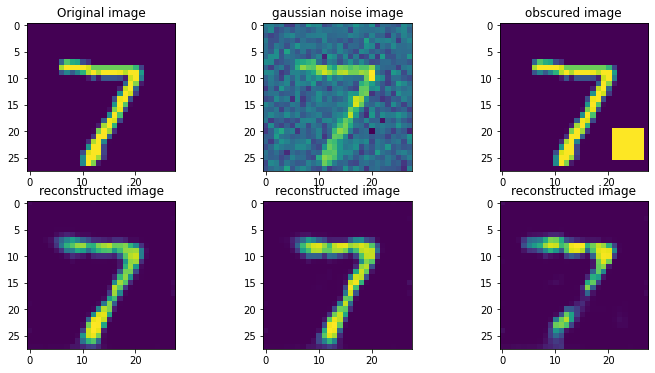

In [ ]:
fig, axs = plt.subplots(2, 3, figsize=(12,6))


axs[0,0].imshow(data_test[0][0].cpu().squeeze().numpy())
axs[0,0].set_title('Original image')
axs[0,1].imshow(noisy_img[0][0].cpu().squeeze().numpy())
axs[0,1].set_title('gaussian noise image')
axs[0,2].imshow(obs_img[0][0].cpu().squeeze().numpy())
axs[0,2].set_title('obscured image')



#reconstructed
if device==torch.device('cuda'):
  axs[1,0].imshow(net( (data_test[0][0].reshape(1,1,28,28).cuda()) ).reshape(28,28).cpu().detach().numpy())
  axs[1,0].set_title('reconstructed image')
  axs[1,1].imshow(net( (noisy_img[0][0].reshape(1,1,28,28).cuda() ) ).reshape(28,28).cpu().detach().numpy())
  axs[1,1].set_title('reconstructed image')
  axs[1,2].imshow(net( (obs_img[0][0].reshape(1,1,28,28).cuda() ) ).reshape(28,28).cpu().detach().numpy())
  axs[1,2].set_title('reconstructed image')


if device==torch.device('cpu'):
  axs[1,0].imshow(net( (data_test[0][0].reshape(1,1,28,28)) ).reshape(28,28).cpu().detach().numpy())
  axs[1,0].set_title('reconstructed image')
  axs[1,1].imshow(net( (noisy_img[0][0].reshape(1,1,28,28)) ).reshape(28,28).cpu().detach().numpy())
  axs[1,1].set_title('reconstructed image')
  axs[1,2].imshow(net( (obs_img[0][0].reshape(1,1,28,28)) ).reshape(28,28).cpu().detach().numpy())
  axs[1,2].set_title('reconstructed image')

# **Supervised Classification Task**

In [ ]:
X_train=torch.stack([data_train[i][0] for i in range(len(data_train))] )
Y_train=torch.tensor([data_train[i][1] for i in range(len(data_train) )])

print(X_train.shape,"\n")
print(Y_train.shape)

torch.Size([60000, 1, 28, 28]) 

torch.Size([60000])


In [ ]:
X_test=torch.stack([data_test[i][0] for i in range(len(data_test))] )
Y_test=torch.tensor([data_test[i][1] for i in range(len(data_test) )])

print(X_test.shape,"\n")
print(Y_test.shape)

torch.Size([10000, 1, 28, 28]) 

torch.Size([10000])


In [ ]:
class Supervise_AutoEncoder_HP(nn.Module):


    def __init__(self,encoded_space_dim):
        super().__init__()
        
        
        # Encoder as previous one
        self.encoder = nn.Sequential(
                                        
                                        # First convolutional layer
                                        nn.Conv2d(1,8, kernel_size=8, padding=0, stride=4),
                                        nn.ReLU(True),
            
                                        # Flatten layer
                                        nn.Flatten(start_dim=1),
            
                                        # First linear layer
                                        nn.Linear(6*6*8,64), 
                                        nn.ReLU(True),
            
                                        #Second linear layer
                                        nn.Linear(64, encoded_space_dim) 

                                    
                                    )
        
        #classification to fine tuning
        self.classification = nn.Linear(encoded_space_dim,10)

    def forward(self, x):
        
        x = self.encoder(x)
        
        x = self.classification(x)
        
        return x

In [ ]:


my_early = EarlyStopping(
    monitor='valid_loss',
    patience=10,
    threshold=0.0001,
    threshold_mode='rel',
    lower_is_better=True)

classification_net = NeuralNetClassifier(
    module = Supervise_AutoEncoder_HP(encoded_space_dim=best_configuration[0]),
    device=device,
    optimizer = optim.Adam,
    optimizer__lr=0.001,
    optimizer__weight_decay=1e-4, #inizialitation
    criterion=nn.CrossEntropyLoss,
    callbacks = [my_early],
)

In [ ]:

params = {
    'max_epochs': [1500],
    'optimizer__lr':[0.005,0.001,0.003,0.006],
    'optimizer__weight_decay':[1e-2,1e-3,1e-4,1e-5] #L2 norm,
}


gs = GridSearchCV(classification_net, params, refit=True, cv=3, scoring="accuracy",verbose=10)

gs.fit(X_train, Y_train)

print(gs.best_score_, gs.best_params_)
classification_net=gs.best_estimator_

Fitting 3 folds for each of 16 candidates, totalling 48 fits
[CV] max_epochs=1500, optimizer__lr=0.005, optimizer__weight_decay=0.01 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.5519       0.9143        0.2914  0.9270
      2        0.2651       0.9176        0.2706  0.8950
      3        0.2267       0.9213        0.2545  0.8889
      4        0.2130       0.9265        0.2367  0.8773
      5        0.2051       0.9275        0.2285  0.8793
      6        0.1984       0.9295        0.2186  0.8782
      7        0.1937       0.9335        0.2108  0.8828
      8        0.1925       0.9344        0.2164  0.8837
      9        0.1895       0.9369        0.2052  0.8843
     10        0.1897       0.9370        0.2096  0.8921
     11        0.1887       0.9366        0.2056  0.8880
     12        0.1870       0.9389        0.2006  0.9062
     13        0.1870       0.9389        0.1994  0.8901
     14        0.1852       0.9375        0.2049  0.8885
     15        0.1855       0.9391        0.1993  0.9004
     16        0.1856       0.9

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   25.3s remaining:    0.0s


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.5244       0.9011        0.3266  0.9780
      2        0.2606       0.9254        0.2455  0.9661
      3        0.2221       0.9326        0.2203  0.9645
      4        0.2123       0.9359        0.2139  0.9672
      5        0.2049       0.9404        0.2060  0.9465
      6        0.2026       0.9404        0.2045  0.9515
      7        0.2015       0.9423        0.2007  0.9369
      8        0.1992       0.9337        0.2196  0.9298
      9        0.2019       0.9385        0.2100  0.9255
     10        0.1979       0.9384        0.2104  0.9462
     11        0.1976       0.9361        0.2112  0.9360
     12        0.1959       0.9463        0.1943  0.9319
     13        0.1947       0.9357        0.2121  0.9501
     14        0.1948       0.9361        0.2119  0.9380
     15        0.1931       0.9367        0.2086  0.9386
     16        0.1914       0.9

[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:  1.1min remaining:    0.0s


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.5233       0.9187        0.2889  0.9066
      2        0.2541       0.9366        0.2429  0.8925
      3        0.2211       0.9467        0.2058  0.8817
      4        0.2072       0.9485        0.2004  0.8941
      5        0.2001       0.9484        0.1922  0.8833
      6        0.2001       0.9503        0.1858  0.8935
      7        0.1962       0.9527        0.1794  0.8998
      8        0.1936       0.9527        0.1796  0.9100
      9        0.1934       0.9533        0.1760  0.9089
     10        0.1941       0.9534        0.1790  0.8835
     11        0.1897       0.9530        0.1804  0.8971
     12        0.1873       0.9529        0.1784  0.8979
     13        0.1860       0.9515        0.1812  0.8853
     14        0.1855       0.9515        0.1829  0.8830
     15        0.1843       0.9513        0.1853  0.8922
     16        0.1844       0.9

[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:  1.4min remaining:    0.0s


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.4400       0.9385        0.2105  0.9776
      2        0.1547       0.9569        0.1391  0.9785
      3        0.1178       0.9581        0.1277  0.9601
      4        0.1001       0.9609        0.1285  0.9418
      5        0.0949       0.9657        0.1105  0.9492
      6        0.0842       0.9616        0.1142  0.9581
      7        0.0760       0.9661        0.1041  0.9670
      8        0.0728       0.9647        0.1050  0.9645
      9        0.0732       0.9673        0.1024  0.9535
     10        0.0696       0.9696        0.0926  0.9490
     11        0.0628       0.9724        0.0871  0.9396
     12        0.0627       0.9667        0.1063  0.9317
     13        0.0610       0.9669        0.1033  0.9402
     14        0.0597       0.9710        0.0920  0.9540
     15        0.0565       0.9663        0.1032  0.9424
     16        0.0601       0.9

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  1.8min remaining:    0.0s


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.4337       0.9365        0.2115  0.9626
      2        0.1623       0.9601        0.1240  0.9499
      3        0.1254       0.9663        0.1109  0.9403
      4        0.1065       0.9665        0.1074  0.9143
      5        0.0898       0.9666        0.1069  0.8893
      6        0.0843       0.9706        0.0938  0.9099
      7        0.0759       0.9716        0.0971  0.9292
      8        0.0725       0.9729        0.0896  0.8753
      9        0.0682       0.9734        0.0871  0.8861
     10        0.0716       0.9721        0.0951  0.8900
     11        0.0663       0.9694        0.1001  0.8901
     12        0.0634       0.9746        0.0874  0.9037
     13        0.0638       0.9683        0.1052  0.8970
     14        0.0618       0.9694        0.0996  0.8848
     15        0.0583       0.9669        0.1127  0.8869
     16        0.0607       0.9

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.1min remaining:    0.0s


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.4377       0.9395        0.2065  0.8997
      2        0.1580       0.9594        0.1397  0.8850
      3        0.1186       0.9561        0.1474  0.8973
      4        0.0997       0.9593        0.1358  0.8841
      5        0.0910       0.9645        0.1238  0.8771
      6        0.0857       0.9571        0.1448  0.8966
      7        0.0832       0.9621        0.1284  0.9263
      8        0.0755       0.9644        0.1161  0.8898
      9        0.0703       0.9596        0.1403  0.8900
     10        0.0700       0.9511        0.1610  0.8950
     11        0.0654       0.9606        0.1317  0.8842
     12        0.0685       0.9669        0.1070  0.8947
     13        0.0652       0.9549        0.1566  0.9053
     14        0.0651       0.9629        0.1262  0.8908
     15        0.0638       0.9688        0.1050  0.8742
     16        0.0605       0.9

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  2.6min remaining:    0.0s


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.4342       0.9444        0.1821  0.9524
      2        0.1397       0.9585        0.1345  0.9260
      3        0.1006       0.9655        0.1204  0.9314
      4        0.0807       0.9651        0.1194  0.9388
      5        0.0652       0.9537        0.1661  0.9407
      6        0.0590       0.9654        0.1372  0.9306
      7        0.0529       0.9477        0.2022  0.9217
      8        0.0524       0.9709        0.1177  0.9349
      9        0.0444       0.9695        0.1276  0.9395
     10        0.0412       0.9663        0.1268  0.9358
     11        0.0355       0.9704        0.1273  0.9519
     12        0.0394       0.9679        0.1339  0.9332
     13        0.0477       0.9728        0.1159  0.9290
     14        0.0323       0.9728        0.1111  0.9176
     15        0.0247       0.9705        0.1328  0.9257
     16        0.0313       0.9

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:  3.0min remaining:    0.0s


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.4267       0.9356        0.2123  0.9054
      2        0.1530       0.9623        0.1246  0.8828
      3        0.1083       0.9664        0.1141  0.9027
      4        0.0840       0.9690        0.1068  0.8839
      5        0.0637       0.9701        0.1085  0.8764
      6        0.0527       0.9715        0.1047  0.9589
      7        0.0505       0.9709        0.1123  0.9422
      8        0.0432       0.9661        0.1298  0.9299
      9        0.0450       0.9716        0.1130  0.9388
     10        0.0417       0.9724        0.1152  0.9286
     11        0.0428       0.9742        0.1038  0.9329
     12        0.0366       0.9669        0.1371  0.9342
     13        0.0326       0.9700        0.1256  0.9355
     14        0.0331       0.9756        0.1110  0.9419
     15        0.0299       0.9735        0.1234  0.9426
     16        0.0339       0.9

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  3.3min remaining:    0.0s


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.4312       0.9449        0.1951  0.9285
      2        0.1477       0.9640        0.1225  0.9343
      3        0.0987       0.9683        0.1093  0.9201
      4        0.0756       0.9722        0.0961  0.9460
      5        0.0662       0.9725        0.0985  0.9336
      6        0.0585       0.9720        0.1051  0.9748
      7        0.0512       0.9732        0.0982  0.9581
      8        0.0445       0.9724        0.1022  0.9389
      9        0.0396       0.9545        0.1714  0.9621
     10        0.0365       0.9685        0.1298  0.9389
     11        0.0380       0.9734        0.1085  0.8845
     12        0.0375       0.9748        0.1130  0.8833
     13        0.0298       0.9739        0.1106  0.8857
Stopping since valid_loss has not improved in the last 10 epochs.
[CV]  max_epochs=1500, optimizer__lr=0.005, optimizer__weight_decay=0.0001, sco

[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  3.5min remaining:    0.0s


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.4344       0.9423        0.1871  0.8845
      2        0.1419       0.9551        0.1439  0.8802
      3        0.0993       0.9635        0.1231  0.8749
      4        0.0764       0.9664        0.1251  0.9018
      5        0.0639       0.9688        0.1199  0.9424
      6        0.0545       0.9660        0.1436  0.8825
      7        0.0507       0.9657        0.1554  0.8808
      8        0.0437       0.9613        0.1712  0.8953
      9        0.0375       0.9708        0.1362  0.8856
     10        0.0411       0.9695        0.1372  0.8823
     11        0.0387       0.9685        0.1484  0.8795
     12        0.0351       0.9724        0.1339  0.8944
     13        0.0326       0.9684        0.1598  0.8777
     14        0.0272       0.9725        0.1387  0.8947
Stopping since valid_loss has not improved in the last 10 epochs.
[CV]  max_epochs=1500,

[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed: 24.1min finished


  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.6272       0.9172        0.2850  1.3255
      2        0.2383       0.9432        0.1933  1.2905
      3        0.1717       0.9536        0.1560  1.3081
      4        0.1364       0.9595        0.1359  1.3142
      5        0.1146       0.9635        0.1217  1.3073
      6        0.1005       0.9652        0.1140  1.3220
      7        0.0900       0.9673        0.1060  1.3160
      8        0.0821       0.9698        0.0998  1.3055
      9        0.0755       0.9712        0.0949  1.2820
     10        0.0699       0.9723        0.0913  1.2901
     11        0.0654       0.9735        0.0879  1.3108
     12        0.0615       0.9732        0.0851  1.3176
     13        0.0581       0.9739        0.0830  1.3227
     14        0.0551       0.9742        0.0817  1.3027
     15        0.0524       0.9748        0.0793  1.2827
     16        0.0498       0.9

In [ ]:
classification_net.fit(X_train, Y_train)

Re-initializing optimizer because the following parameters were re-set: lr, weight_decay.
  epoch    train_loss    valid_acc    valid_loss     dur
-------  ------------  -----------  ------------  ------
      1        0.0248       0.9793        0.0646  1.3423
      2        0.0238       0.9801        0.0644  1.3515
      3        0.0236       0.9789        0.0652  1.3207
      4        0.0234       0.9802        0.0644  1.2984
      5        0.0239       0.9802        0.0653  1.3196
      6        0.0231       0.9799        0.0645  1.3221
      7        0.0235       0.9802        0.0644  1.2994
      8        0.0236       0.9803        0.0643  1.3024
      9        0.0233       0.9798        0.0642  1.3022
     10        0.0230       0.9792        0.0646  1.3266
     11        0.0234       0.9792        0.0651  1.3081
     12        0.0231       0.9807        0.0640  1.3155
     13        0.0232       0.9798        0.0639  1.3246
     14        0.0231       0.9808        0.0637  1.324

<class 'skorch.classifier.NeuralNetClassifier'>[initialized](
  module_=Supervise_AutoEncoder_HP(
    (encoder): Sequential(
      (0): Conv2d(1, 8, kernel_size=(8, 8), stride=(4, 4))
      (1): ReLU(inplace=True)
      (2): Flatten(start_dim=1, end_dim=-1)
      (3): Linear(in_features=288, out_features=64, bias=True)
      (4): ReLU(inplace=True)
      (5): Linear(in_features=64, out_features=32, bias=True)
    )
    (classification): Linear(in_features=32, out_features=10, bias=True)
  ),
)

In [ ]:
gs.best_params_

{'max_epochs': 1500, 'optimizer__lr': 0.001, 'optimizer__weight_decay': 0.001}

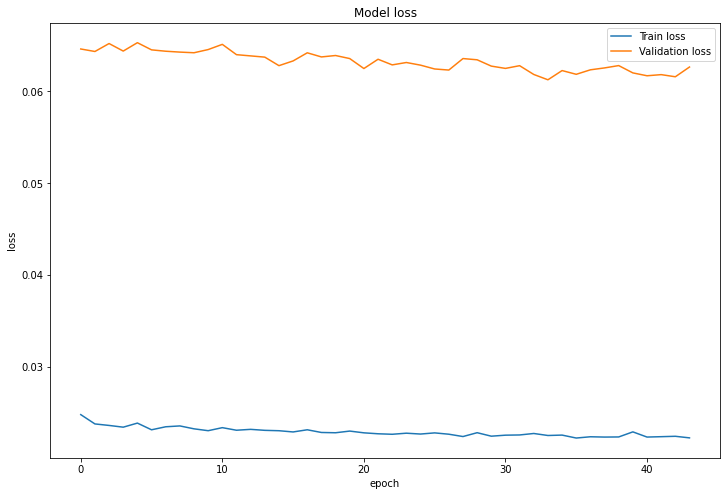

In [ ]:

C_path="/content/drive/MyDrive/homework2_NNDL/"
save_name="Classification_lr_"+str(gs.best_params_["optimizer__lr"])+"weight_decay"+str(gs.best_params_["optimizer__weight_decay"])

# get train losses from all epochs, a list of floats
history = classification_net.history
train_loss_log=history[:, 'train_loss']
val_loss_log=history[:, 'valid_loss']

# Plot losses
plt.figure(figsize=(12,8))
plt.plot(train_loss_log)
plt.plot(val_loss_log)
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train loss', 'Validation loss'], loc='upper right')
plt.savefig(C_path+save_name+"_Losses.png", dpi=400)
plt.show()

In [ ]:

y_pred = classification_net.predict(X_test)

test_acc = accuracy_score(Y_test, y_pred)
print(test_acc)

0.9829


In [ ]:

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.YlOrRd,
                          save_path= C_path+save_name):
    

    plt.figure(figsize=(15, 15))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title, fontsize=30)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45, fontsize=15)
    plt.yticks(tick_marks, classes, fontsize=15)

    fmt = '.3f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt), size=11,
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label', fontsize=30)
    plt.xlabel('Predicted label', fontsize=30)
    plt.savefig(save_path+"ConfMatrix.png", dpi=400)
    plt.tight_layout()

Train Loss:	 0.022
Val Acc:	 0.981
Test Acc:	 0.983


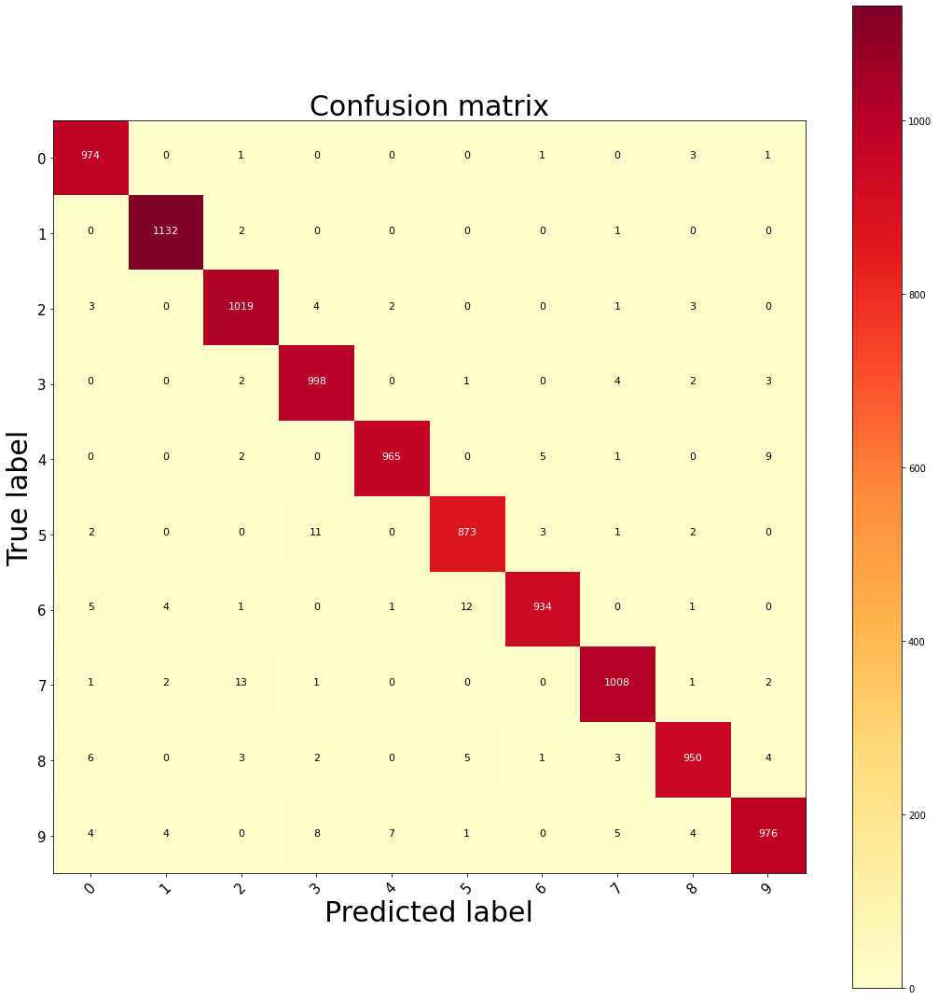

In [ ]:
#Accuracy
val_acc=history[:, 'valid_acc'][-1]
val_loss=history[:, 'valid_loss'][-1]
train_loss=history[:, 'train_loss'][-1]

print("Train Loss:\t",round(train_loss,3))
print("Val Acc:\t",round(val_acc,3))
print("Test Acc:\t",round(float(test_acc),3))

# Confusion Matrix

cm = confusion_matrix(Y_test, y_pred)
categories=[0,1,2,3,4,5,6,7,8,9]
plot_confusion_matrix(cm,categories, normalize=False)

# **Explore the latent space structure (e.g., PCA, t-SNE) and generate new samples from latent codes**

In [ ]:
def Encoded_space(net):
  samples = []
  labels = []
  plots = []

  for sample in tqdm(data_test):               
    
      img = sample[0].unsqueeze(0)
      label = sample[1]
      # Encode image
      net.eval()
      with torch.no_grad():
          encoded_img  = net.encoder(img.to(device))
      # Append to list
      #print(encoded_img.flatten().numpy())               #uncomment if you want to see images in encoded space
      samples.append(encoded_img.flatten().cpu().numpy())
      labels.append(label)
      plots.append((encoded_img.flatten().cpu().numpy(),label))

  samples = np.array(samples)                                       
  tsne = manifold.TSNE(n_components=2, init='pca', random_state=0)   #https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html
  X_tsne = tsne.fit_transform(samples)

  encoded_samples = [(X_tsne[x],labels[x]) for x in range(len(data_test))]

   ### Visualize encoded space
  color_map = {
          0: 'blue', 1: 'orange',
          2: 'green',3: 'pink',
          4: 'red',5: 'purple',
          6: 'olive',7: 'cyan',
          8: 'brown',9: 'gray'
          }

  # Plot just 3k points
  encoded_samples_reduced = random.sample(encoded_samples, 3000)
  fig, ax = plt.subplots(figsize=(5,5))

  for enc_sample, label in tqdm(encoded_samples_reduced):
      ax.plot(enc_sample[0], enc_sample[1], marker='.', color=color_map[label])
      ax.set_xlabel('Coordinate 1')
      ax.set_ylabel('Coordinate 2')
      ax.grid(True)
      ax.legend([plt.Line2D([0], [0], ls='', marker='.', color=c, label=l) for l, c in color_map.items()], color_map.keys())
  plt.tight_layout()
  plt.show()


100%|██████████| 3000/3000 [00:27<00:00, 108.38it/s]


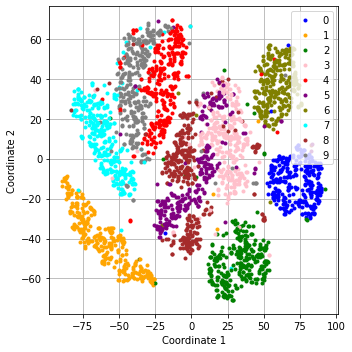

In [ ]:
Encoded_space(net)

# New samples

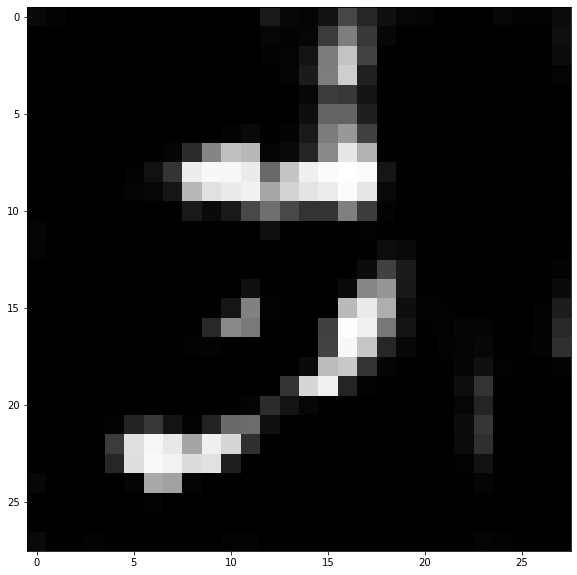

In [ ]:
custom_encoded_sample=[]
for i in range(best_configuration[0]):
  random=np.random.randint(-20,20)
  custom_encoded_sample.append(random)

encoded_value = torch.tensor(custom_encoded_sample).float().unsqueeze(0).to(device)
# Decode sample
net.eval()
with torch.no_grad():
    generated_img  = net.decoder(encoded_value)

plt.figure(figsize=(12,10))
plt.imshow(generated_img.squeeze().cpu().numpy(), cmap='gist_gray')
plt.show()

# **Convolutional GAN**

In [6]:

def generate_images(epoch, path, noise, num_test_samples, netG, device):
  
    generated_fake_images = netG(noise)
    path += 'new_images/'


    if os.path.isdir(path) == False:
      dir_name="new_images"
      os.mkdir(dir_name)

    #layout
    size_figure_grid = int(math.sqrt(num_test_samples))
    fig, ax = plt.subplots(size_figure_grid, size_figure_grid, figsize=(6,6))
    for i, j in itertools.product(range(size_figure_grid), range(size_figure_grid)):
        ax[i,j].get_xaxis().set_visible(False)
        ax[i,j].get_yaxis().set_visible(False)
    for k in range(num_test_samples):
        i = k//4
        j = k%4
        ax[i,j].cla()
        ax[i,j].imshow(generated_fake_images[k].data.cpu().numpy().reshape(28,28), cmap='Greys')
    label = 'Epoch_{}'.format(epoch+1)
    fig.text(0.5, 0.04, label, ha='center')
    fig.savefig(path+label+'.png')


## Network

In [7]:
class Generator(nn.Module):
    def __init__(self, nc, nz, ngf):
      super(Generator, self).__init__()
      self.network = nn.Sequential(
          nn.ConvTranspose2d(nz, ngf*4, 4, 1, 0, bias=False),
          nn.BatchNorm2d(ngf*4),
          nn.ReLU(True),
  
          nn.ConvTranspose2d(ngf*4, ngf*2, 3, 2, 1, bias=False),
          nn.BatchNorm2d(ngf*2),
          nn.ReLU(True),
  
          nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
          nn.BatchNorm2d(ngf),
          nn.ReLU(True),
  
          nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
          nn.Tanh()
      )
  
    def forward(self, input):
      output = self.network(input)
      return output

class Discriminator(nn.Module):
    def __init__(self, nc, ndf):
        super(Discriminator, self).__init__()
        self.network = nn.Sequential(
                
                nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
                nn.LeakyReLU(0.2, inplace=True),
                
                nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 2),
                nn.LeakyReLU(0.2, inplace=True),
                
                nn.Conv2d(ndf * 2, ndf * 4, 3, 2, 1, bias=False),
                nn.BatchNorm2d(ndf * 4),
                nn.LeakyReLU(0.2, inplace=True),
                
                nn.Conv2d(ndf * 4, 1, 4, 1, 0, bias=False),
                nn.Sigmoid()
            )
    def forward(self, input):
        output = self.network(input)
        return output.view(-1, 1).squeeze(1)

## Parameters

In [8]:
#generator
nz=100
ngf=32
nc=1

#discriminator
ndf=32

#learning rate

d_lr=0.0005   

g_lr=0.0005

#batch_size

batch_size=128

#number test sample

num_test_samples=16

#number epoch

num_epochs=100



In [14]:

# MNIST Dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.15, ), std=(0.30, ))])

train_dataset = datasets.MNIST(root="/content/DATA_homework2/dataset_train",train=True, transform=transform, download=False)

# Data Loader
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)


In [15]:
netG = Generator(nc, nz, ngf).to(device)
netD = Discriminator(nc, ndf).to(device)

In [16]:
# loss function
criterion = nn.BCELoss()

# optimizers
optimizerD = optim.Adam(netD.parameters(), lr=d_lr)
optimizerG = optim.Adam(netG.parameters(), lr=g_lr)

# initialize other variables
real_label = 1
fake_label = 0
num_batches = len(train_loader)
noise = torch.randn( num_test_samples, 100, 1, 1, device=device)

## GAN  training

In [17]:
path="/content/"

Epoch [1/100], step [100/469], d_loss: 0.0372, g_loss: 7.0224, D(x): 0.99, Discriminator - D(G(x)): 0.02, Generator - D(G(x)): 0.00
Epoch [1/100], step [200/469], d_loss: 0.0074, g_loss: 7.0512, D(x): 1.00, Discriminator - D(G(x)): 0.00, Generator - D(G(x)): 0.00
Epoch [1/100], step [300/469], d_loss: 0.0103, g_loss: 7.5434, D(x): 0.99, Discriminator - D(G(x)): 0.00, Generator - D(G(x)): 0.00
Epoch [1/100], step [400/469], d_loss: 0.0023, g_loss: 8.0013, D(x): 1.00, Discriminator - D(G(x)): 0.00, Generator - D(G(x)): 0.00
Epoch [2/100], step [100/469], d_loss: 0.0058, g_loss: 8.3044, D(x): 1.00, Discriminator - D(G(x)): 0.00, Generator - D(G(x)): 0.00
Epoch [2/100], step [200/469], d_loss: 0.0018, g_loss: 7.6582, D(x): 1.00, Discriminator - D(G(x)): 0.00, Generator - D(G(x)): 0.00
Epoch [2/100], step [300/469], d_loss: 0.0023, g_loss: 8.2182, D(x): 1.00, Discriminator - D(G(x)): 0.00, Generator - D(G(x)): 0.00
Epoch [2/100], step [400/469], d_loss: 0.0060, g_loss: 6.5690, D(x): 1.00, D

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


Epoch [22/100], step [100/469], d_loss: 0.4769, g_loss: 3.6483, D(x): 0.69, Discriminator - D(G(x)): 0.02, Generator - D(G(x)): 0.06
Epoch [22/100], step [200/469], d_loss: 0.1357, g_loss: 3.5515, D(x): 0.95, Discriminator - D(G(x)): 0.07, Generator - D(G(x)): 0.06
Epoch [22/100], step [300/469], d_loss: 0.1448, g_loss: 4.6060, D(x): 0.92, Discriminator - D(G(x)): 0.04, Generator - D(G(x)): 0.03
Epoch [22/100], step [400/469], d_loss: 0.1827, g_loss: 2.8698, D(x): 0.92, Discriminator - D(G(x)): 0.08, Generator - D(G(x)): 0.11
Epoch [23/100], step [100/469], d_loss: 0.3795, g_loss: 3.3544, D(x): 0.90, Discriminator - D(G(x)): 0.19, Generator - D(G(x)): 0.07
Epoch [23/100], step [200/469], d_loss: 0.4477, g_loss: 2.1025, D(x): 0.97, Discriminator - D(G(x)): 0.29, Generator - D(G(x)): 0.20
Epoch [23/100], step [300/469], d_loss: 0.1867, g_loss: 4.5136, D(x): 0.89, Discriminator - D(G(x)): 0.05, Generator - D(G(x)): 0.03
Epoch [23/100], step [400/469], d_loss: 0.2008, g_loss: 3.4225, D(x):

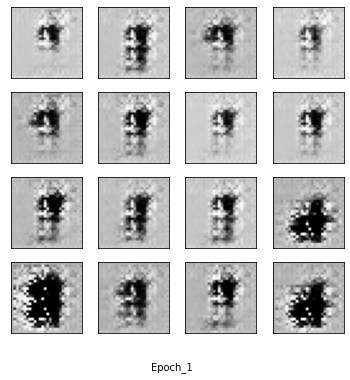

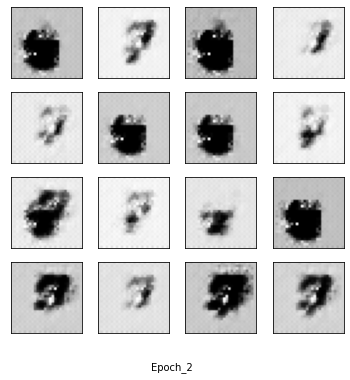

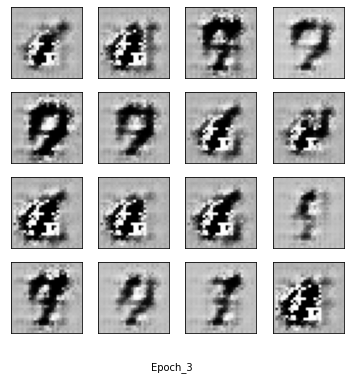

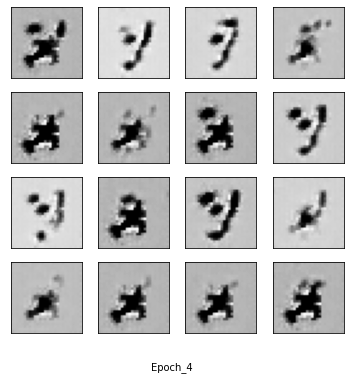

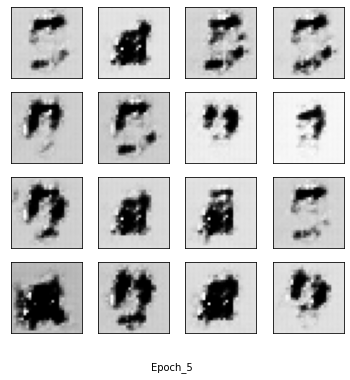

...

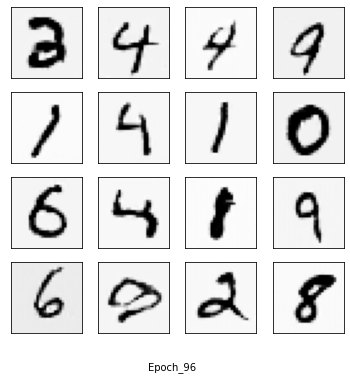

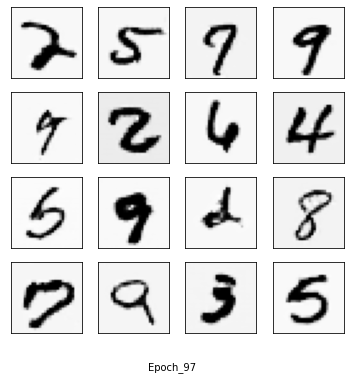

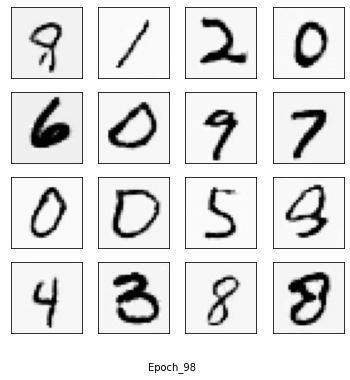

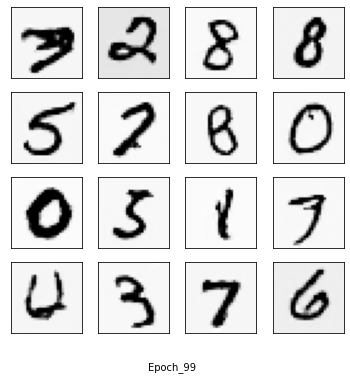

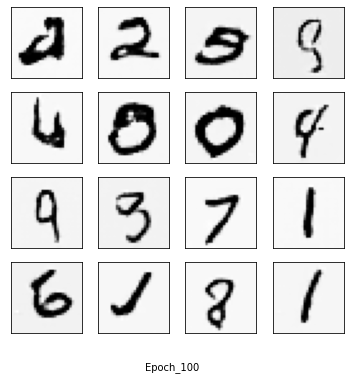

In [18]:
for epoch in range(num_epochs):
        for i, (real_images, _) in enumerate(train_loader):
            bs = real_images.shape[0]
            
            #   Training discriminator  
            

            netD.zero_grad()
            real_images = real_images.to(device)
            label = torch.full((bs,), real_label, device=device).type(torch.float32)

            output = netD(real_images)
            lossD_real = criterion(output, label)
            lossD_real.backward()
            D_x = output.mean().item()

            noise = torch.randn(bs, nz, 1, 1, device=device)
            fake_images = netG(noise)
            label.fill_(fake_label)
            output = netD(fake_images.detach())
            lossD_fake = criterion(output, label)
            lossD_fake.backward()
            D_G_z1 = output.mean().item()
            lossD = lossD_real + lossD_fake
            optimizerD.step()

            
            #   Training generator   
            

            netG.zero_grad()
            label.fill_(real_label)
            output = netD(fake_images)
            lossG = criterion(output, label)
            lossG.backward()
            D_G_z2 = output.mean().item()
            optimizerG.step()

            if (i+1)%100 == 0:
                print('Epoch [{}/{}], step [{}/{}], d_loss: {:.4f}, g_loss: {:.4f}, D(x): {:.2f}, Discriminator - D(G(x)): {:.2f}, Generator - D(G(x)): {:.2f}'.format(epoch+1,num_epochs, 
                                                            i+1, num_batches, lossD.item(), lossG.item(), D_x, D_G_z1, D_G_z2))
        netG.eval()
        generate_images(epoch,path, noise, num_test_samples, netG, device )
        netG.train()